In [1]:
# Disable GPU
#import os
#os.environ['CUDA_VISIBLE_DEVICES'] = ''

In [2]:
import os
import sys
import glob
import json
import pickle
import copy
import itertools
from functools import partial
from multiprocessing import Pool

import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from scipy.stats import skew

import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.lines as mlines
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
from matplotlib.ticker import FuncFormatter, ScalarFormatter

from IPython.display import display

try:
    import bayesflow as bf
except ModuleNotFoundError:  
    sys.path.extend([
        os.path.abspath(os.path.join("../..")),
        os.path.abspath(os.path.join("../../BayesFlow_dev/BayesFlow/"))
    ])
    import bayesflow as bf

import functions_param_estim as prior_simulator_functions

#%load_ext autoreload
#%autoreload 2

2025-05-22 17:55:45.760757: I tensorflow/core/util/port.cc:111] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
/home/administrator/miniconda3/envs/bf/lib/python3.10/site-packages/bayesflow/trainers.py:27: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


# Check Functions

In [3]:
params = prior_simulator_functions.levy_prior(False, 32)[1]
params

array([ 0.24015504,  0.13469388,  0.5040483 , -3.45832   ,  3.845328  ,
        0.8402903 ,  1.4825809 ], dtype=float32)

In [4]:
ndt, st0, zr, v0, v1, a, alpha = params
prior_simulator_functions.diffusion_trial(ndt, st0, zr, v0, a, alpha, False)

0.0384156130967791

In [5]:
prior_simulator_functions.ddm_simulator(params, 10, deadline=False)

array([[ 0.34949996,  0.        ],
       [-0.36881333,  0.        ],
       [-0.34705329,  0.        ],
       [-0.28699626,  0.        ],
       [-0.36175539,  0.        ],
       [-0.38308611,  1.        ],
       [ 0.3393408 ,  1.        ],
       [ 0.28774465,  1.        ],
       [ 0.35758263,  1.        ],
       [ 0.37133316,  1.        ]])

# Set Constants

In [6]:
# Generative model
PARAM_NAMES = ['t0', 'st0', 'zr', 'v0',  'v1', 'a', 'alpha']
PARAM_LABELS = [r"$t_0$", r"$s_{t_0}$", r"$z_r$", r"$v_{0}$", r"$v_{1}$", r"$a$", r"$\alpha$"]
PRIOR_CONTEXTS =  ["levy", "ddm"]
model_map = {"levy": "Lévy-flight", "ddm": "diffusion"}
SIMULATOR_CONTEXTS = ["no_deadline"] #["no_deadline", "deadline"]

# Neural networks
NUM_ENSEMBLE_MEMBERS = 2
NUM_ITERATIONS_PER_EPOCH = 10000
BATCH_SIZE = 32
SUMMARY_NET_SETTINGS = {
    "summary_dim" : 20, #16,
    "num_dense_s1" : 3,
    "num_dense_s2" : 3,
    "num_dense_s3" : 3,
    "num_dense_equivariant" : 3
}

# Validation
NUM_COMBINATIONS = len(PRIOR_CONTEXTS) * len(SIMULATOR_CONTEXTS)
NUM_VAL_SIMS_PER_COMBINATION = 500
NUM_VAL_SAMPLES = 1000
NUM_VAL_OBS = 400

# Global
if NUM_COMBINATIONS==4:
    NUM_EPOCHS = 500
elif NUM_COMBINATIONS==2:
    NUM_EPOCHS = 250
else:
    NUM_EPOCHS = 125
TRAINING_MODE = "presimulation" #online
MY_NAME = "ttj_" + TRAINING_MODE + "_" + str(NUM_EPOCHS) + "ep_" + str(NUM_ITERATIONS_PER_EPOCH) + 'it_' + '_'.join(PRIOR_CONTEXTS + SIMULATOR_CONTEXTS) 
MY_DPI = 200 #600

# Presimulation (irrelevant if online training is used)
RUNNER = "pc2" #"pc1"
PRESIM_PATH = "/media/administrator/Expansion/"
NUM_PROCESSES = 25 

print(MY_NAME)

ttj_presimulation_250ep_10000it_levy_ddm_no_deadline


# Generative Model

Careful: Context is implemented batch-wise, so all data sets of a batch will have the same context. 
I.e., the same number of observations, the same computational model (Levy or DDM), and the same deadline condition (no deadline or deadline).
That means that e.g., generative_model(1000) will simulate all data sets from a single combination of those constellations!
See validation part below for getting samples under all combinations.

In [7]:
def binary_context_generator():
    """ 
    Generates binary context indicators for joint parameter estimation.
    Prior context: 0 = Levy, 1 = DDM.
    Simulator context: 0 = no deadline, 1 = deadline.
    """
    return np.random.binomial(n=1, p=0.5)
def prior_context_generator():
    """
    Generates a fixed context indicator based on the global PRIOR_CONTEXTS variable.
    Returns:
        int: Fixed context value (0 for "levy", 1 for "ddm").
    """
    return 0 if PRIOR_CONTEXTS == ["levy"] else 1
def simulator_context_generator():
    """
    Generates a fixed context indicator based on the global SIMULATOR_CONTEXTS variable.
    Returns:
        int: Fixed context value (0 for "no_deadline", 1 for "deadline").
    """
    return 0 if SIMULATOR_CONTEXTS == ["no_deadline"] else 1

In [8]:
# Determine the appropriate context generator functions based on the number of combinations
# and potentially the length of context-specific lists (PRIOR_CONTEXTS).
if NUM_COMBINATIONS == 1:
    # Use dedicated context generators for debugging or single-context scenarios.
    prior_fun = prior_context_generator
    simulator_fun = simulator_context_generator
elif NUM_COMBINATIONS == 2:
    # Choose between specific or binary context generators based on the length of PRIOR_CONTEXTS.
    # This allows for a mix of deterministic and randomized contexts depending on the setup.
    prior_fun = prior_context_generator if len(PRIOR_CONTEXTS) == 1 else binary_context_generator
    simulator_fun = binary_context_generator if len(PRIOR_CONTEXTS) == 1 else simulator_context_generator
else:  # NUM_COMBINATIONS == 4
    # In scenarios requiring a broader range of combinations, use binary context generators for both.
    prior_fun = simulator_fun = binary_context_generator

In [9]:
# Assign the context generators to create the context generator objects.
my_prior_context_generator = bf.simulation.ContextGenerator(non_batchable_context_fun=prior_fun)
my_simulator_context_generator = bf.simulation.ContextGenerator(non_batchable_context_fun=simulator_fun) if NUM_COMBINATIONS != 4 else my_prior_context_generator

# Prior
prior = bf.simulation.Prior(
    batch_prior_fun=prior_simulator_functions.levy_prior, 
    context_generator=my_prior_context_generator,
    param_names=PARAM_NAMES
)

# Simulator
simulator = bf.simulation.Simulator(
    batch_simulator_fun=prior_simulator_functions.batch_simulator,
    context_generator=my_simulator_context_generator
)

# Combine the prior and simulator into a GenerativeModel.
generative_model = bf.simulation.GenerativeModel(prior=prior, simulator=simulator)

INFO:root:Performing 2 pilot runs with the anonymous model...
INFO:root:Shape of parameter batch after 2 pilot simulations: (batch_size = 2, 7)
INFO:root:Shape of simulation batch after 2 pilot simulations: (batch_size = 2, 413, 2)
INFO:root:Could not determine shape of prior non-batchable context. Type appears to be non-array: <class 'int'>,                                    so make sure your input configurator takes cares of that!
INFO:root:No optional prior batchable context provided.
INFO:root:Could not determine shape of simulation non-batchable context. Type appears to be non-array: <class 'int'>,                                    so make sure your input configurator takes cares of that!
INFO:root:No optional simulation batchable context provided.


In [10]:
prior(batch_size=2)  # For the DDM, alpha = 2 during simulation -> replaced by a sample from dummy standard normal during configuration

{'prior_draws': array([[ 0.28602928,  0.01747096,  0.42374644, -3.0101511 ,  2.6284912 ,
          0.77115387,  1.2769885 ],
        [ 0.36176553,  0.13946863,  0.54308254, -2.657625  ,  1.3345996 ,
          0.94200695,  1.6342348 ]], dtype=float32),
 'batchable_context': None,
 'non_batchable_context': 0}

In [11]:
sim_data = generative_model(batch_size=2)
sim_data

{'prior_non_batchable_context': 0,
 'prior_batchable_context': None,
 'prior_draws': array([[ 0.2360555 ,  0.01185096,  0.47651726, -3.8622487 ,  3.4089565 ,
          0.92242724,  1.6330456 ],
        [ 0.46926618,  0.08556043,  0.35250914, -4.2964053 ,  3.8925214 ,
          0.6322773 ,  1.4340881 ]], dtype=float32),
 'sim_non_batchable_context': 0,
 'sim_batchable_context': None,
 'sim_data': array([[[-0.42172745,  0.        ],
         [-0.3720459 ,  0.        ],
         [-0.47429994,  0.        ],
         ...,
         [ 0.36662298,  1.        ],
         [ 0.51900834,  1.        ],
         [ 0.29014054,  1.        ]],
 
        [[-0.50650996,  0.        ],
         [-0.5473284 ,  0.        ],
         [-0.4803593 ,  0.        ],
         ...,
         [ 0.5439621 ,  1.        ],
         [ 0.47604167,  1.        ],
         [ 0.58657634,  1.        ]]], dtype=float32)}

# Prior Checks

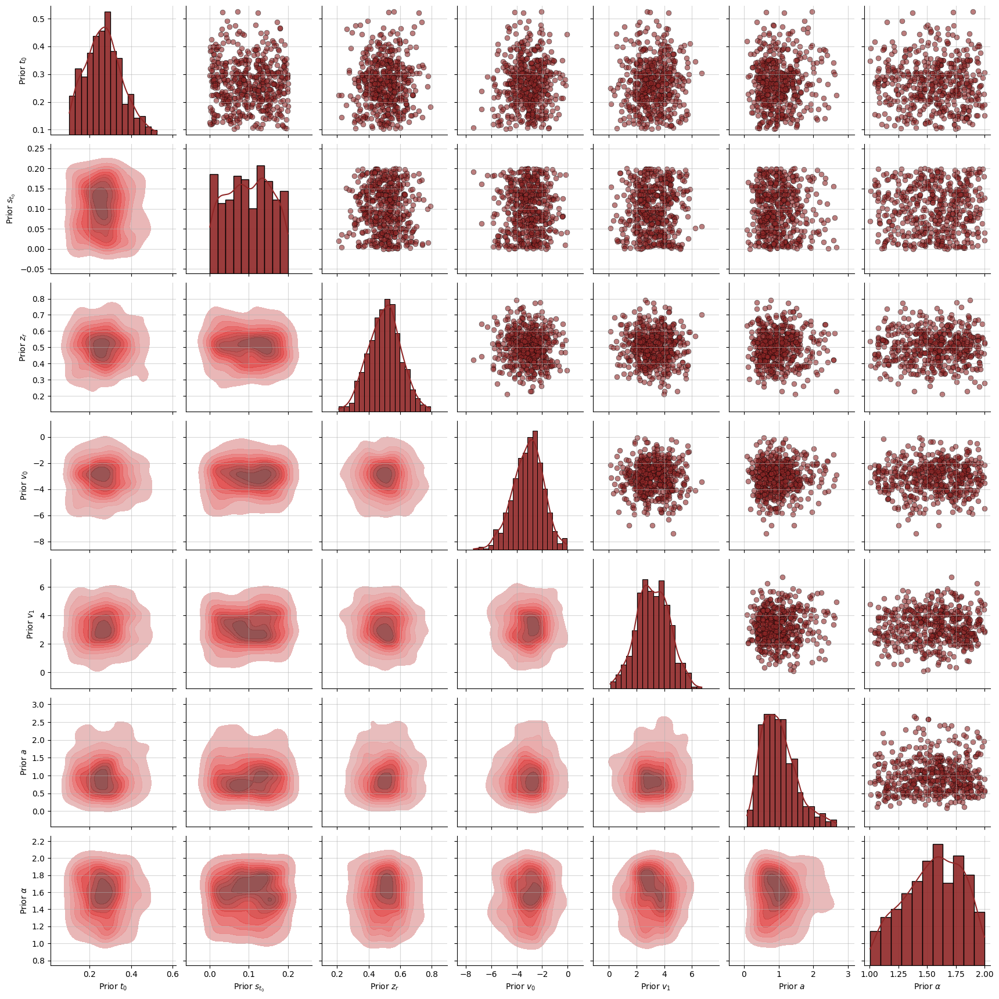

In [12]:
check_levy_prior = bf.simulation.Prior(
    batch_prior_fun=prior_simulator_functions.levy_prior, 
    context_generator=bf.simulation.ContextGenerator(non_batchable_context_fun=lambda: 0),
    param_names=PARAM_LABELS)
plot = check_levy_prior.plot_prior2d(n_samples=500)

# Prior Push Forward Check

In [13]:
#SIMULATOR_CONTEXTS ="deadline"
if NUM_COMBINATIONS == 1:
    context_combinations = [(prior_context_generator(), simulator_context_generator())]
elif NUM_COMBINATIONS == 2:
    if len(PRIOR_CONTEXTS) == 1:
        context_combinations = [(prior_context_generator(), sim_context) for sim_context in range(len(SIMULATOR_CONTEXTS))]
    else:
        context_combinations = [(prior_context, simulator_context_generator()) for prior_context in range(len(PRIOR_CONTEXTS))]
else:  # NUM_COMBINATIONS == 4 or more complex cases
    context_combinations = list(itertools.product(range(len(PRIOR_CONTEXTS)), range(len(SIMULATOR_CONTEXTS))))

In [14]:
my_batch_size = 500  
all_rows = []

for prior_context, sim_context in context_combinations:
    check_prior = bf.simulation.Prior(
        batch_prior_fun=prior_simulator_functions.levy_prior,
        context_generator=bf.simulation.ContextGenerator(non_batchable_context_fun=lambda: prior_context),
        param_names=PARAM_NAMES
    )
    check_simulator = bf.simulation.Simulator(
        batch_simulator_fun=prior_simulator_functions.batch_simulator,
        context_generator=bf.simulation.ContextGenerator(non_batchable_context_fun=lambda: sim_context)
    )

    check_generative_model = bf.simulation.GenerativeModel(prior=check_prior, simulator=check_simulator)
    sim_rts = check_generative_model(batch_size=my_batch_size)['sim_data']  

    df = pd.DataFrame({
        'pp': np.repeat(np.arange(my_batch_size), sim_rts.shape[1]),
        'RT': sim_rts[:, :, 0].flatten(),
        'symbol': sim_rts[:, :, 1].astype(int).flatten(),
        'prior': prior_context,
        'simulator': sim_context
    })

    cond1 = (df['RT'] < 0) & (df['symbol'] == 1)
    cond2 = (df['RT'] > 0) & (df['symbol'] == 1)
    cond3 = (df['RT'] < 0) & (df['symbol'] == 0)
    cond4 = (df['RT'] > 0) & (df['symbol'] == 0)

    df['correct'] = np.nan
    df.loc[cond1, 'correct'] = 0
    df.loc[cond2, 'correct'] = 1
    df.loc[cond3, 'correct'] = 1
    df.loc[cond4, 'correct'] = 0
    df['correct'] = df['correct'].astype('Int64')

    df.loc[df['RT'] == 0, 'RT'] = np.nan
    df['RT'] = abs(df['RT'])

    for pp, group in df.groupby('pp'):
        RTs_correct = group.loc[group['correct'] == 1, 'RT']
        RTs_incorrect = group.loc[group['correct'] == 0, 'RT']
        
        mean_corr = RTs_correct.mean() if not RTs_correct.empty else np.nan
        mean_incorr = RTs_incorrect.mean() if not RTs_incorrect.empty else np.nan  
        mean_diff = mean_corr - mean_incorr if pd.notnull(mean_corr) and pd.notnull(mean_incorr) else np.nan

        skew_corr = skew(RTs_correct, bias=False) if RTs_correct.size > 2 else np.nan
        skew_incorr = skew(RTs_incorrect, bias=False) if RTs_incorrect.size > 2 else np.nan

        acc = group['correct'].mean()
        prop_timeout = group['RT'].isna().mean()
        
        all_rows.append({
            'prior': prior_context,
            'simulator': sim_context,
            'pp': pp,
            'meanRT_corr': mean_corr,
            'meanRT_incorr': mean_incorr,
            'meanRT_diff': mean_diff,
            'skew_corr': skew_corr,
            'skew_incorr': skew_incorr,
            'acc': acc,
            'prop_timeout': prop_timeout
        })

df_results = pd.DataFrame(all_rows)

df_results['is_sym_corr'] = df_results['skew_corr'].between(-1, 1)
df_results['is_sym_incorr'] = df_results['skew_incorr'].between(-1, 1)

INFO:root:Performing 2 pilot runs with the anonymous model...
INFO:root:Shape of parameter batch after 2 pilot simulations: (batch_size = 2, 7)
INFO:root:Shape of simulation batch after 2 pilot simulations: (batch_size = 2, 343, 2)
INFO:root:Could not determine shape of prior non-batchable context. Type appears to be non-array: <class 'int'>,                                    so make sure your input configurator takes cares of that!
INFO:root:No optional prior batchable context provided.
INFO:root:Could not determine shape of simulation non-batchable context. Type appears to be non-array: <class 'int'>,                                    so make sure your input configurator takes cares of that!
INFO:root:No optional simulation batchable context provided.
INFO:root:Performing 2 pilot runs with the anonymous model...
INFO:root:Shape of parameter batch after 2 pilot simulations: (batch_size = 2, 7)
INFO:root:Shape of simulation batch after 2 pilot simulations: (batch_size = 2, 350, 2)
IN

In [15]:
my_vars = ['pp', 'prior', 'simulator', 'prop_timeout', 'is_sym_corr', 'acc']

df_rt = pd.melt(df_results, id_vars=my_vars, value_vars=['meanRT_corr', 'meanRT_incorr'], var_name='corr', value_name='rt')
df_rt['corr'] = df_rt['corr'].str.replace('meanRT_', '')

df_skew = pd.melt(df_results, id_vars=my_vars, value_vars=['skew_corr', 'skew_incorr'], var_name='corr', value_name='skew')
df_skew['corr'] = df_skew['corr'].str.replace('skew_', '')

df_long = pd.merge(df_rt, df_skew, on=my_vars + ['corr'])

In [16]:
min_corr = df_long[df_long['corr'] == 'corr']['rt'].min()
max_corr = df_long[df_long['corr'] == 'corr']['rt'].max()
min_incorr = df_long[df_long['corr'] == 'incorr']['rt'].min()
max_incorr = df_long[df_long['corr'] == 'incorr']['rt'].max()
min_rt = min(min_corr, min_incorr)
max_rt = max(max_corr, max_incorr)

min_corr = df_long[df_long['corr'] == 'corr']['skew'].min()
max_corr = df_long[df_long['corr'] == 'corr']['skew'].max()
min_incorr = df_long[df_long['corr'] == 'incorr']['skew'].min()
max_incorr = df_long[df_long['corr'] == 'incorr']['skew'].max()
min_skew = min(min_corr, min_incorr)
max_skew = max(max_corr, max_incorr)

min_acc = df_long[df_long['corr'] == 'corr']['acc'].min()
max_acc = df_long[df_long['corr'] == 'corr']['acc'].max()

Timeout Modeling:  Absent
Timeout Modeling:  Absent


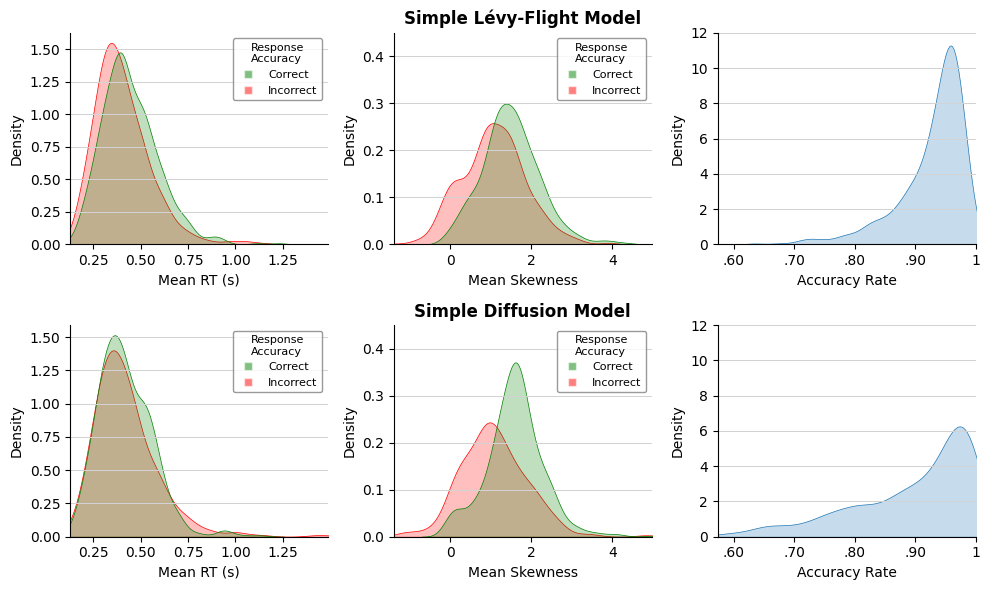

In [17]:
def apa_tick_formatter(digits=1):
    def formatter(x, _):
        if x == int(x):
            return str(int(x))
        else:
            return f'{x:.{digits}f}'.lstrip('0') 
    return formatter

prior_map = {0: "Simple Lévy-Flight Model", 1: "Simple Diffusion Model"}
simulator_map = {0: "Absent", 1: "Present"}
combinations = df_long[['prior', 'simulator']].drop_duplicates().sort_values(['prior', 'simulator']).values

n_rows = len(combinations)
fig, axs = plt.subplots(n_rows, 3, figsize=(10, 3 * n_rows), sharex=0)

if n_rows == 1:
    axs = [axs]

for i, (prior_val, sim_val) in enumerate(combinations):
    subset = df_long[(df_long['prior'] == prior_val) & (df_long['simulator'] == sim_val)]
    prior_label = prior_map[prior_val]
    simulator_label = simulator_map[sim_val]
    print("Timeout Modeling: ", simulator_label)

    # RT plot 
    sns.kdeplot(
        data=subset, x='rt', hue='corr', ax=axs[i][0],
        fill=True, lw=0.5, palette={'corr': 'green', 'incorr': 'red'}, legend=0
    )
    axs[i][0].grid(True, axis='y', color='lightgrey', linestyle='-', linewidth=0.75, zorder=0)
    axs[i][0].spines['top'].set_visible(False)
    axs[i][0].spines['right'].set_visible(False)
    axs[i][0].set_xlim([min_rt, max_rt])
    axs[i][0].set_xlabel('Mean RT (s)')

    legend_items = [mlines.Line2D([0], [0], marker='s', color='w', label="Correct",
                                  markerfacecolor="green", 
                                  #markersize=my_marker_size, 
                                  alpha=0.5),
                    mlines.Line2D([0], [0], marker='s', color='w', label="Incorrect",
                                  markerfacecolor="red", 
                                  #markersize=my_marker_size, 
                                  alpha=0.5)]
    legend = axs[i][0].legend(handles=legend_items, title='Response\nAccuracy',
                     loc='upper right', frameon=True,
                     facecolor='white', edgecolor='gray', fontsize=8)
    legend.get_title().set_fontsize(8)

    # Skewness plot
    sns.kdeplot(
        data=subset, x='skew', hue='corr', ax=axs[i][1],
        fill=True, lw=0.5, palette={'corr': 'green', 'incorr': 'red'}, legend=False
    )
    axs[i][1].set_title(f'{prior_label}', fontweight="bold")
    axs[i][1].grid(True, axis='y', color='lightgrey', linestyle='-', linewidth=0.75, zorder=0)
    axs[i][1].spines['top'].set_visible(False)
    axs[i][1].spines['right'].set_visible(False)
    axs[i][1].set_xlim([min_skew, max_skew])
    axs[i][1].set_ylim([0, .45])
    axs[i][1].set_xlabel('Mean Skewness')

    legend = axs[i][1].legend(handles=legend_items, title='Response\nAccuracy',
                     loc='upper right', frameon=True,
                     facecolor='white', edgecolor='gray', fontsize=8)
    legend.get_title().set_fontsize(8)

    # Accuracy plot
    sns.kdeplot(
        data=subset, x='acc', ax=axs[i][2], fill=True, lw=0.5, legend=False
    )
    axs[i][2].grid(True, axis='y', color='lightgrey', linestyle='-', linewidth=0.75, zorder=0)
    axs[i][2].spines['top'].set_visible(False)
    axs[i][2].spines['right'].set_visible(False)
    axs[i][2].set_xlim([min_acc, max_acc])
    axs[i][2].set_ylim([0, 12])
    axs[i][2].set_xlabel('Accuracy Rate')
    axs[i][2].xaxis.set_major_formatter(FuncFormatter(apa_tick_formatter(digits=2)))

plt.tight_layout()
plt.show()

# Configurator

Direct_conditions constitutes of a vector of 3 context elements for each data set: 
1. Number of observations
2. Computational model (0 = Levy, 1 = DDM)
3. Deadline condition (0 = no deadline, 1 = deadline)

In [18]:
def configurator(forward_dict):
    """Configure the output of the generative model for BayesFlow."""

    batch_size = forward_dict["sim_data"].shape[0]
    out_dict = {}

    # Summary conditions
    out_dict["summary_conditions"] = forward_dict["sim_data"]

    # Direct conditions: context dimensions num_obs, computational model (prior), and deadline condition (simulator)
    vec_ones = np.ones((batch_size, 1)).astype(np.float32)
    vec_num_obs = np.sqrt(forward_dict["sim_data"].shape[1]) * vec_ones
    vec_prior_context = forward_dict["prior_non_batchable_context"] * vec_ones
    vec_sim_context = forward_dict["sim_non_batchable_context"] * vec_ones
    out_dict["direct_conditions"] = np.concatenate([vec_num_obs, vec_prior_context, vec_sim_context], axis=1)

    # Parameters
    out_dict["parameters"] = forward_dict["prior_draws"].copy()
    # For DDM: Replace constant alpha parameters with random draws from a dummy standard normal
    if np.any(forward_dict["prior_non_batchable_context"]):  # 1 = DDM (works for both ints and vectors)
        out_dict["parameters"][:, -1] = np.random.normal(loc=0.0, scale=1.0, size=batch_size)

    return out_dict

In [19]:
print(sim_data["prior_draws"])
configurator(sim_data)

[[ 0.2360555   0.01185096  0.47651726 -3.8622487   3.4089565   0.92242724
   1.6330456 ]
 [ 0.46926618  0.08556043  0.35250914 -4.2964053   3.8925214   0.6322773
   1.4340881 ]]


{'summary_conditions': array([[[-0.42172745,  0.        ],
         [-0.3720459 ,  0.        ],
         [-0.47429994,  0.        ],
         ...,
         [ 0.36662298,  1.        ],
         [ 0.51900834,  1.        ],
         [ 0.29014054,  1.        ]],
 
        [[-0.50650996,  0.        ],
         [-0.5473284 ,  0.        ],
         [-0.4803593 ,  0.        ],
         ...,
         [ 0.5439621 ,  1.        ],
         [ 0.47604167,  1.        ],
         [ 0.58657634,  1.        ]]], dtype=float32),
 'direct_conditions': array([[19.849434,  0.      ,  0.      ],
        [19.849434,  0.      ,  0.      ]], dtype=float32),
 'parameters': array([[ 0.2360555 ,  0.01185096,  0.47651726, -3.8622487 ,  3.4089565 ,
          0.92242724,  1.6330456 ],
        [ 0.46926618,  0.08556043,  0.35250914, -4.2964053 ,  3.8925214 ,
          0.6322773 ,  1.4340881 ]], dtype=float32)}

# Neural Network Training

## Pre Training

In [20]:
def f(x, presim_path):
    """
    Perform simulations for a given index and save results to a specified path.
    Simulation results are generated and directly written into the file within the loop. 
    
    Args:
        x (int): The current index or epoch number for which to generate and save simulation results.
        presim_path (str): The file path to the directory where simulation results should be stored.
    """
    # Construct the full path for the new pickle file using the presimulation path and index
    file_path = os.path.join(presim_path, f'presim_file_{x}.pkl')
    
    # Open the new file in write-binary mode
    with open(file_path, 'wb+') as file:
        # Generate and save simulation results for the specified number of iterations
        for k in range(NUM_ITERATIONS_PER_EPOCH):
            # Generate simulation results using the predefined generative model
            presim_res = generative_model(BATCH_SIZE)
            # Save the generated results into the pickle file
            pickle.dump(presim_res, file)

def f2(x, presim_path='sims'):
    """
    Perform simulations for a given index and save results to a specified path.
    All simulation results are first collected into a list file_list, and then the entire list is written to the file in one go outside of the loop.

    Args:
        x (int): The current index or epoch number for which to generate and save simulation results.
        presim_path (str, optional): The file path to the directory where simulation results should be stored. Defaults to 'sims'.
    """

    # Initialize a list to hold simulated data for each iteration
    file_list = [{} for _ in range(NUM_ITERATIONS_PER_EPOCH)]

    # Generate simulated data for each iteration
    for k in range(NUM_ITERATIONS_PER_EPOCH):
        file_list[k] = generative_model(BATCH_SIZE)  # Replace with actual simulation data

    # Construct the full path to the output file
    file_path = f'{presim_path}/presim_file_{x}.pkl'

    # Save the simulated data to a pickle file
    with open(file_path, 'wb+') as f:
        pickle.dump(file_list, f)

def multipickle_loader(file_path):
    """
    Load multiple pickle files from a single file and return their contents.
    
    This function reads a pickle file that potentially contains multiple
    pickled objects and returns them as a list.
    
    Args:
        file_path (str): The path to the pickle file from which to load objects.
    
    Returns:
        list: A list of objects that were stored in the pickle file.
    """
    # Initialize an empty list to store the simulation dictionaries
    sim_dicts = []
    # Open the specified pickle file in read-binary mode
    with open(file_path, 'rb') as f:
        try:
            # Continuously load objects from the file until an EOFError is raised
            while True:
                sim_dicts.append(pickle.load(f))
        except EOFError:
            # An EOFError indicates the end of the file has been reached
            pass
    
    # Return the list of simulation dictionaries
    return sim_dicts

In [21]:
def setup_network(
    checkpoint_path,
    input_dim=2,
    summary_net_settings=SUMMARY_NET_SETTINGS,
    param_names=PARAM_NAMES,
    num_coupling_layers=9,
    coupling_design="spline",
    generative_model=generative_model,
    configurator=configurator,
    learning_rate=0.0001 #0.00025
):
    """
    Set up a neural network for parameter estimation (works within a loop over ensemble members).
    
    Parameters:
    -----------
    checkpoint_path : str, optional
        Path to save checkpoints during training and load network from after training.
    input_dim : int, optional
        Dimensionality of the input data (default is 2).
    summary_net_settings : dict, optional
        Settings for the summary network (default is SUMMARY_NET_SETTINGS).
    param_names : list, optional
        List of parameter names (default is PARAM_NAMES).
    num_coupling_layers : int, optional
        Number of coupling layers in the invertible network (default is 7).
    coupling_design : str, optional
        Design choice for coupling layers (default is "spline").
    generative_model : tf.keras.Model, optional
        Generative model (default is generative_model).
    configurator : object, optional
        Configurator for training setup.
    learning_rate : float, optional
        Learning rate for Adam optimizer (default is 0.0001).

    Returns:
    -----------
    tuple
        Tuple containing amortizer (AmortizedPosterior), trainer (Trainer), and optimizer objects.
    """
    tf.keras.backend.clear_session()
    summary_net = bf.networks.DeepSet(
        summary_dim = summary_net_settings["summary_dim"],
        num_dense_s1 = summary_net_settings["num_dense_s1"],
        num_dense_s2 = summary_net_settings["num_dense_s2"],
        num_dense_s3 = summary_net_settings["num_dense_s3"],
        num_equiv = summary_net_settings["num_dense_equivariant"]
    )
    inference_net = bf.networks.InvertibleNetwork(
        num_params=len(param_names), 
        num_coupling_layers=num_coupling_layers, 
        coupling_design=coupling_design
    )
    amortizer = bf.amortizers.AmortizedPosterior(inference_net, summary_net)
    trainer = bf.trainers.Trainer(
        amortizer=amortizer, 
        generative_model=generative_model, 
        configurator=configurator,
        checkpoint_path=checkpoint_path,
        default_lr=learning_rate
    )
    optimizer = tf.keras.optimizers.Adam(learning_rate=
                                         tf.keras.optimizers.schedules.CosineDecay(
                                             learning_rate, NUM_ITERATIONS_PER_EPOCH*NUM_EPOCHS, alpha=0.0, name=None)
                                        )
    
    return amortizer, trainer, optimizer

In [22]:
# Presimulation (if applicable)
if __name__ == '__main__':
    if TRAINING_MODE == "presimulation":
        FULL_PRESIM_PATH = os.path.join(PRESIM_PATH, MY_NAME)
        if not os.path.exists(FULL_PRESIM_PATH): # Disables further presimulation if already existant 
            os.makedirs(FULL_PRESIM_PATH)
            
            if RUNNER == "pc1":
                with Pool(processes=NUM_PROCESSES) as pool:
                    presim_function = partial(f2, presim_path=FULL_PRESIM_PATH)
                    pool.map(presim_function, range(NUM_EPOCHS))
            else:
                with Pool(processes=NUM_PROCESSES) as pool:
                    presim_function = partial(f, presim_path=FULL_PRESIM_PATH)
                    pool.map(presim_function, range(NUM_EPOCHS))

## Training

INFO:root:Loaded loss history from checkpoint_ttj_presimulation_250ep_10000it_levy_ddm_no_deadline/net1/history_250.pkl.
INFO:root:Networks loaded from checkpoint_ttj_presimulation_250ep_10000it_levy_ddm_no_deadline/net1/ckpt-250
INFO:root:Performing a consistency check with provided components...
INFO:root:Done.
INFO:root:Loaded loss history from checkpoint_ttj_presimulation_250ep_10000it_levy_ddm_no_deadline/net2/history_250.pkl.
INFO:root:Networks loaded from checkpoint_ttj_presimulation_250ep_10000it_levy_ddm_no_deadline/net2/ckpt-250
INFO:root:Performing a consistency check with provided components...
INFO:root:Done.


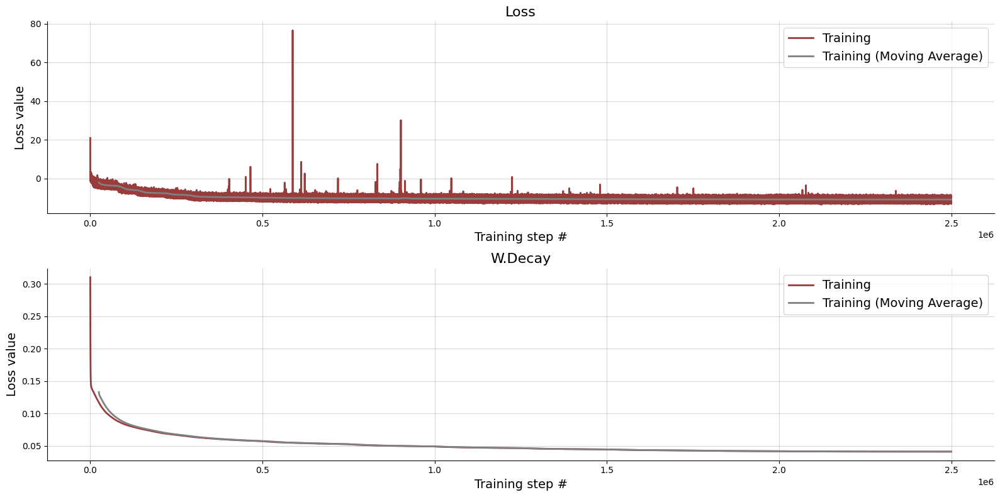

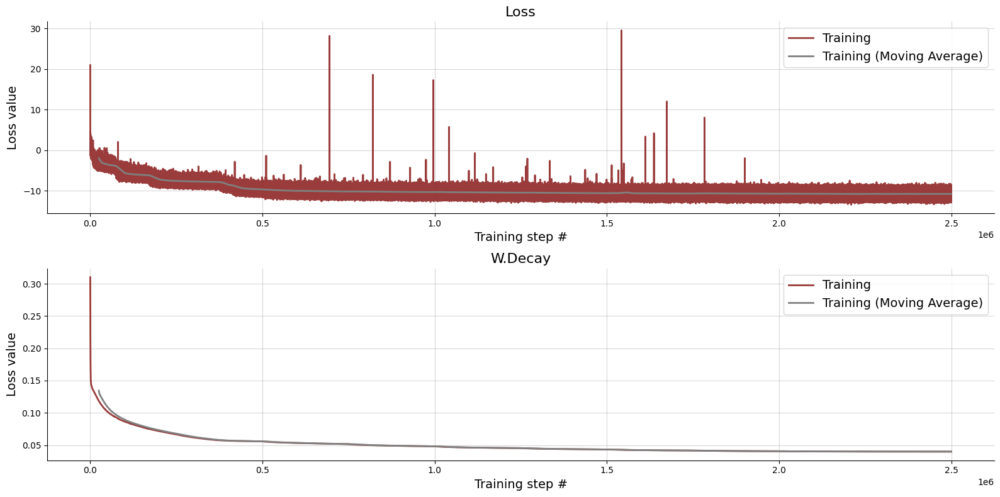

In [23]:
# Iterate over ensemble members (networks): training
for network in range(NUM_ENSEMBLE_MEMBERS):
    amortizer, trainer, optimizer = setup_network(checkpoint_path=f"checkpoint_{MY_NAME}/net{network + 1}")
    
    if not os.path.exists(f"checkpoint_{MY_NAME}/net{network + 1}"): # Disables further training when net was loaded from checkpoint
        if TRAINING_MODE == "presimulation":
            if RUNNER == "pc1":
                losses = trainer.train_from_presimulation(FULL_PRESIM_PATH, 
                                                          optimizer = optimizer, 
                                                          reuse_optimizer=True
                                                         )
            else: 
                losses = trainer.train_from_presimulation(FULL_PRESIM_PATH, 
                                                          optimizer = optimizer, 
                                                          reuse_optimizer=True, 
                                                          custom_loader=multipickle_loader
                                                         )
        else:
            losses = trainer.train_online(epochs=NUM_EPOCHS, iterations_per_epoch=NUM_ITERATIONS_PER_EPOCH, batch_size=BATCH_SIZE)

    f = bf.diagnostics.plot_losses(trainer.loss_history.get_plottable(), moving_average=True)
    #f.savefig("figures/" + MY_NAME + "_net" +str(network + 1)+ "_losses.png")

## Post Training

### Inspect Losses

In [24]:
for network in range(NUM_ENSEMBLE_MEMBERS):
    amortizer, trainer, optimizer = setup_network(checkpoint_path=f"checkpoint_{MY_NAME}/net{network + 1}")
    my_history_net = trainer.loss_history.get_plottable()

    print("Network", network+1)
    print("shape:", my_history_net.shape)
    print(my_history_net.tail(10))

    first_nan_index = my_history_net['Loss'].isna().idxmax()
    last_valid_index_loss = my_history_net['Loss'].last_valid_index()
    last_valid_value_loss = my_history_net.at[last_valid_index_loss, 'Loss']
    print('Last valid value:', last_valid_value_loss)
    print('Last valid index:', last_valid_index_loss)

    following_rows = my_history_net.loc[last_valid_index_loss+1:]
    print('All following values are invalid' if following_rows.isna().all(axis=1).all() and first_nan_index!=0 else 'All values are valid')

INFO:root:Loaded loss history from checkpoint_ttj_presimulation_250ep_10000it_levy_ddm_no_deadline/net1/history_250.pkl.
INFO:root:Networks loaded from checkpoint_ttj_presimulation_250ep_10000it_levy_ddm_no_deadline/net1/ckpt-250
INFO:root:Performing a consistency check with provided components...
INFO:root:Done.


Network 1
shape: (2500000, 2)
              Loss   W.Decay
2499990 -12.158354  0.041019
2499991 -10.192549  0.041019
2499992 -11.248327  0.041019
2499993 -11.694826  0.041019
2499994 -10.540638  0.041019
2499995 -10.255383  0.041019
2499996 -10.104689  0.041019
2499997 -10.287640  0.041019
2499998 -11.870313  0.041019
2499999 -10.737546  0.041019
Last valid value: -10.737546
Last valid index: 2499999
All values are valid


INFO:root:Loaded loss history from checkpoint_ttj_presimulation_250ep_10000it_levy_ddm_no_deadline/net2/history_250.pkl.
INFO:root:Networks loaded from checkpoint_ttj_presimulation_250ep_10000it_levy_ddm_no_deadline/net2/ckpt-250
INFO:root:Performing a consistency check with provided components...
INFO:root:Done.


Network 2
shape: (2500000, 2)
              Loss   W.Decay
2499990 -12.276291  0.040018
2499991  -9.894992  0.040018
2499992 -11.221998  0.040018
2499993 -11.803003  0.040018
2499994 -10.168325  0.040018
2499995 -10.059430  0.040018
2499996  -9.976507  0.040018
2499997  -9.806446  0.040018
2499998 -11.767874  0.040018
2499999 -10.817751  0.040018
Last valid value: -10.817751
Last valid index: 2499999
All values are valid


# Validation

In [25]:
# File paths
VAL_ROOT_PATH = "validation_files"
os.makedirs(VAL_ROOT_PATH, exist_ok=True)
VAL_SIMS_FILE = VAL_ROOT_PATH + "/val_sims_list_" + MY_NAME + ".pkl"
PRIOR_SAMPLES_FILE = VAL_ROOT_PATH + "/prior_samples_" + MY_NAME + ".pkl"
POST_SAMPLES_FILE = VAL_ROOT_PATH + "/post_samples_" + MY_NAME + ".pkl"

def save_data(data, file_path):
    with open(file_path, "wb") as f:
        pickle.dump(data, f)

def load_data(file_path):
    with open(file_path, "rb") as f:
        return pickle.load(f)

# Check if files exist and load if possible, otherwise create
if all(os.path.exists(file) for file in [VAL_SIMS_FILE, PRIOR_SAMPLES_FILE, POST_SAMPLES_FILE]):
    print("Loading previously saved data...")
    val_sims_list = load_data(VAL_SIMS_FILE)
    prior_samples = load_data(PRIOR_SAMPLES_FILE)
    post_samples = load_data(POST_SAMPLES_FILE)
    print("Data loaded succesfully.")
else:
    print("Generating new data...")

    # Configuration and prior/simulator setup
    PRIOR_CONFIGS = {
        "levy": bf.simulation.Prior(batch_prior_fun=partial(prior_simulator_functions.levy_prior, fix_alpha=False), param_names=PARAM_NAMES),
        "ddm": bf.simulation.Prior(batch_prior_fun=partial(prior_simulator_functions.levy_prior, fix_alpha=True), param_names=PARAM_NAMES),
    }
    SIMULATOR_CONFIGS = {
        "no_deadline": bf.simulation.Simulator(batch_simulator_fun=partial(prior_simulator_functions.batch_simulator, deadline=False)),
        "deadline": bf.simulation.Simulator(batch_simulator_fun=partial(prior_simulator_functions.batch_simulator, deadline=True)),
    }

    # Initialize list to hold validation simulation results
    val_sims_list = []

    # Function to configure and append data
    def configure_and_append(prior_context, sim_context, num_sims=NUM_VAL_SIMS_PER_COMBINATION):
        prior = PRIOR_CONFIGS[prior_context]
        simulator = SIMULATOR_CONFIGS[sim_context]
        generative_model_combination = bf.simulation.GenerativeModel(prior=prior, simulator=simulator, skip_test=True)
        val_data_combination = generative_model_combination(batch_size=num_sims)
        val_data_combination['prior_non_batchable_context'] = 0 if prior_context == "levy" else 1
        val_data_combination['sim_non_batchable_context'] = 0 if sim_context == "no_deadline" else 1
        configured_val_data_combination = configurator(val_data_combination)
        val_sims_list.append(configured_val_data_combination)

    # Generate validation data for each combination of contexts
    for prior_context, sim_context in itertools.product(PRIOR_CONTEXTS, SIMULATOR_CONTEXTS):
        configure_and_append(prior_context, sim_context)

    # Extract prior samples and generate posterior samples for each combination
    prior_samples = [val_data_combination["parameters"] for val_data_combination in val_sims_list]

    post_samples = []
    for network in range(NUM_ENSEMBLE_MEMBERS):
        amortizer, trainer, optimizer = setup_network(checkpoint_path=f"checkpoint_{MY_NAME}/net{network + 1}")
        network_samples = [amortizer.sample(val_data_combination, n_samples=NUM_VAL_SAMPLES) for val_data_combination in val_sims_list]
        post_samples.append(network_samples)

    # Save data to files
    print("Saving data...")
    save_data(val_sims_list, VAL_SIMS_FILE)
    save_data(prior_samples, PRIOR_SAMPLES_FILE)
    save_data(post_samples, POST_SAMPLES_FILE)
    print("Data saved successfully.")

os.makedirs("figures", exist_ok=True)

Loading previously saved data...
Data loaded succesfully.


levy; no_deadline; network 1


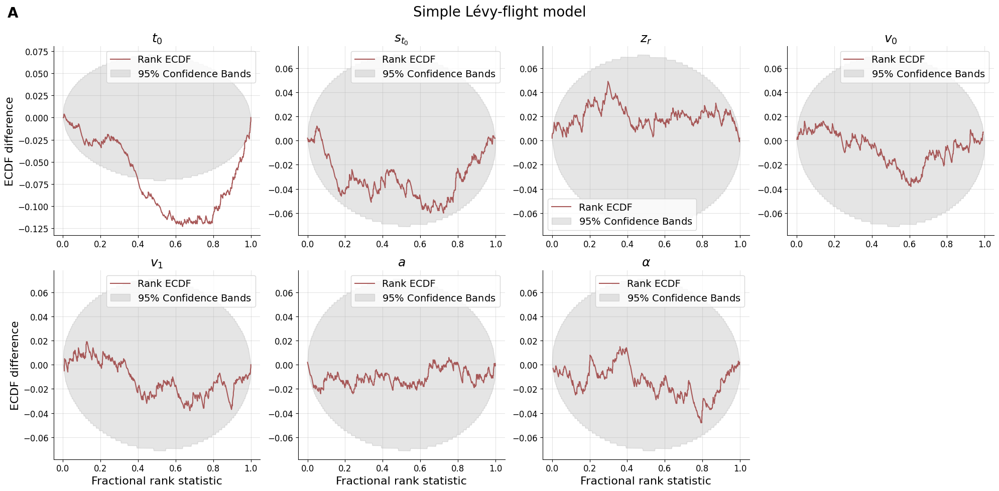

levy; no_deadline; network 2


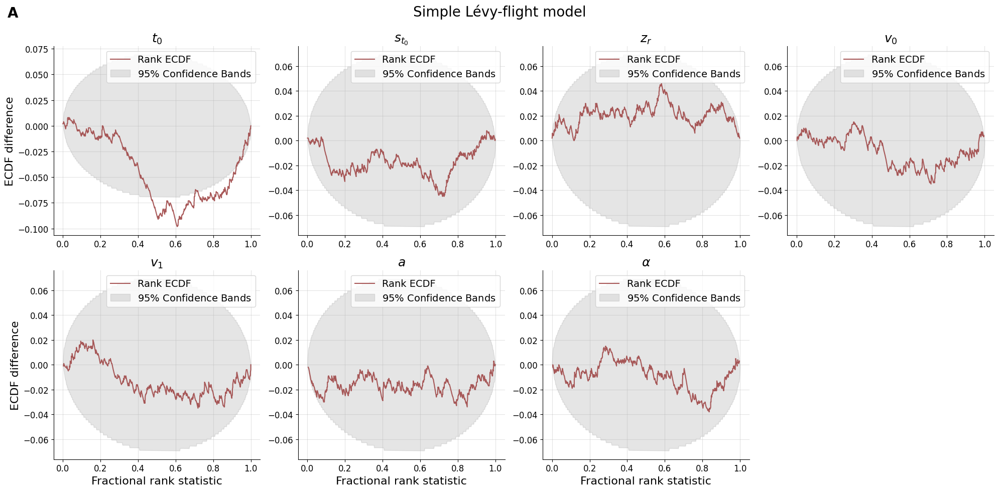

ddm; no_deadline; network 1


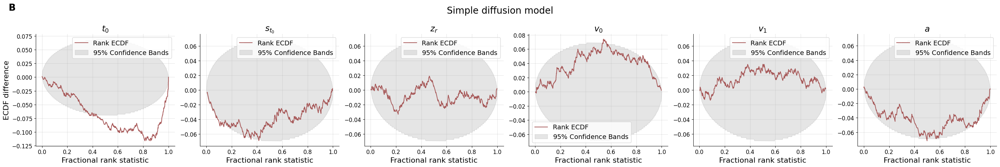

ddm; no_deadline; network 2


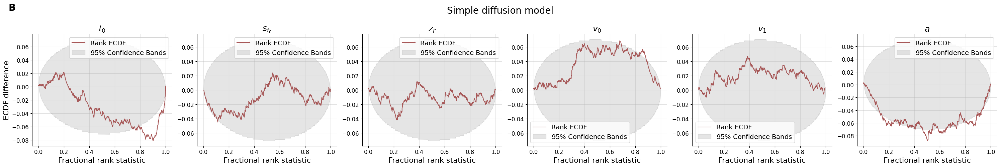

In [26]:
# SBC ECDFs
must_edit = 0
for c in range(NUM_COMBINATIONS):
    for network in range(NUM_ENSEMBLE_MEMBERS):
        comp_model = "ddm" if val_sims_list[c]["direct_conditions"][0, 1] else "levy"
        condition = "deadline" if val_sims_list[c]["direct_conditions"][0, 2] else "no_deadline"
        
        # Modify data and parameter labels if comp_model is "ddm" to hide dummy
        if comp_model == "ddm" and must_edit==0:
            post_samples_mod = post_samples[network][c][..., :-1]  
            prior_samples_mod = prior_samples[c][..., :-1]        
            param_names = PARAM_LABELS[:6]  
        else:
            post_samples_mod = post_samples[network][c]
            prior_samples_mod = prior_samples[c]
            param_names = PARAM_LABELS
            
        f = bf.diagnostics.plot_sbc_ecdf(
            post_samples_mod, prior_samples_mod,
            stacked=False, difference=True, param_names=param_names,
            n_row=2, n_col=4 
        )
        
        f.suptitle(f'Simple {model_map.get(comp_model)} model', fontsize=20, y=0.975)
        annotation = "A" if comp_model == "levy" else "B"
        f.text(0.01, 0.95, annotation, fontsize=20, ha='left', fontweight='bold')
        plt.tight_layout(rect=[0, 0, 1, 0.98])

        if comp_model == "ddm" and must_edit:
            filename = f"figures/ecdf_net{network+1}_{comp_model}_{condition}_edit.png"
        else:
            filename = f"figures/ecdf_net{network+1}_{comp_model}_{condition}.png"
        plt.savefig(filename, transparent=False, bbox_inches='tight', dpi=MY_DPI)

        print(f'{comp_model}; {condition}; network {network + 1}')
        plt.show()

In [27]:
def filter_nan_post_samples(post_samples, prior_samples, num_combinations, num_ensemble_members):
    """
    Filters out NaN posterior samples (if present) so that plot_recovery does not crash; reports the number, fraction 
    and corresponding prior samples of NaN posterior samples.

    Parameters:
    -----------
    post_samples : nested list of numpy.ndarrays 
        Posterior samples to filter.
        Hierarchy/shape: (num_network)(num_combinations)(num_datasets, num_samples, num_parameters)
    num_combinations : int
        Number of condition combinations.
    num_ensemble_members : int
        Number of ensemble members.

    Returns:
    --------
    post_samples_filtered : numpy.ndarray
        Filtered posterior samples without NaN.
    """
    post_samples_filtered = copy.deepcopy(post_samples)

    for c in range(num_combinations):
        for network in range(num_ensemble_members):
            nan_mask = np.isnan(post_samples_filtered[network][c])
            
            if np.any(nan_mask):
                nan_fraction = nan_mask.sum() / post_samples_filtered[network][c].size
                num_parameters = post_samples_filtered[network][c].shape[-1]
                print(f"Number of NaN samples in network {network + 1}, condition {c + 1}: {nan_mask.sum() / num_parameters}")
                print(f"Fraction of NaNs in network {network + 1}, condition {c + 1}: {nan_fraction}")
                
                nan_dataset_indices = np.any(nan_mask, axis=1)
                nan_sample_indices = np.any(nan_mask, axis=(0, 2))
                print(f"NaN in posterior samples for following prior samples: {prior_samples[c][nan_dataset_indices]}")
                post_samples_filtered[network][c] = post_samples_filtered[network][c][:, ~nan_sample_indices, :]

    return post_samples_filtered

post_samples_filtered = filter_nan_post_samples(
    post_samples=post_samples,
    prior_samples=prior_samples,
    num_combinations=NUM_COMBINATIONS,
    num_ensemble_members=NUM_ENSEMBLE_MEMBERS
)

levy; no_deadline; network 1


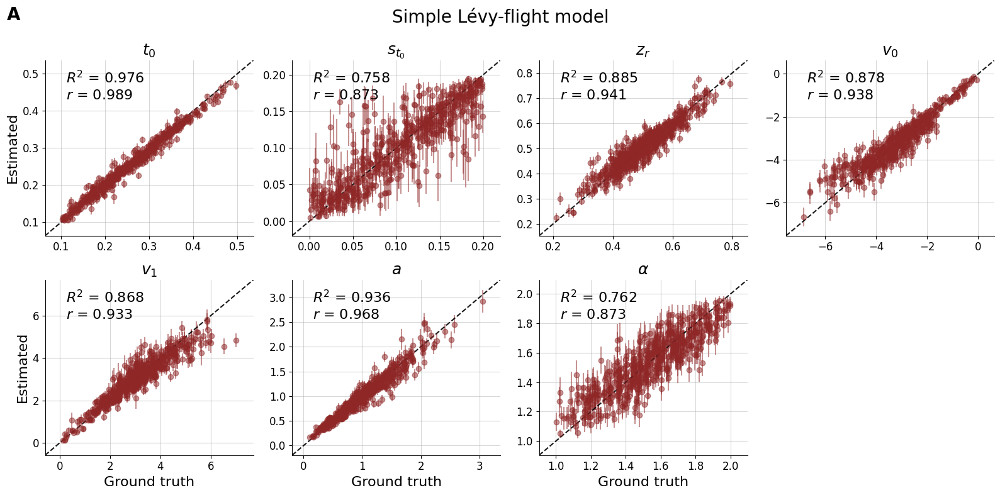

levy; no_deadline; network 2


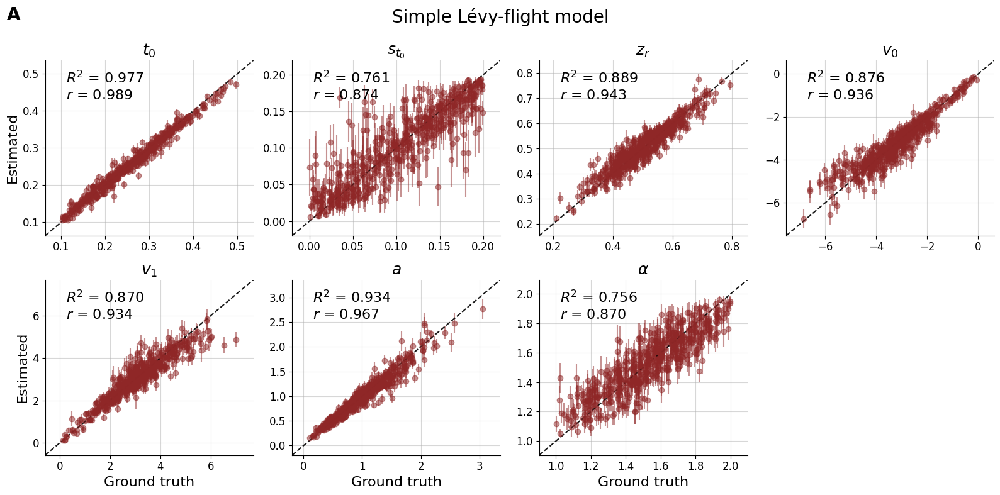

ddm; no_deadline; network 1


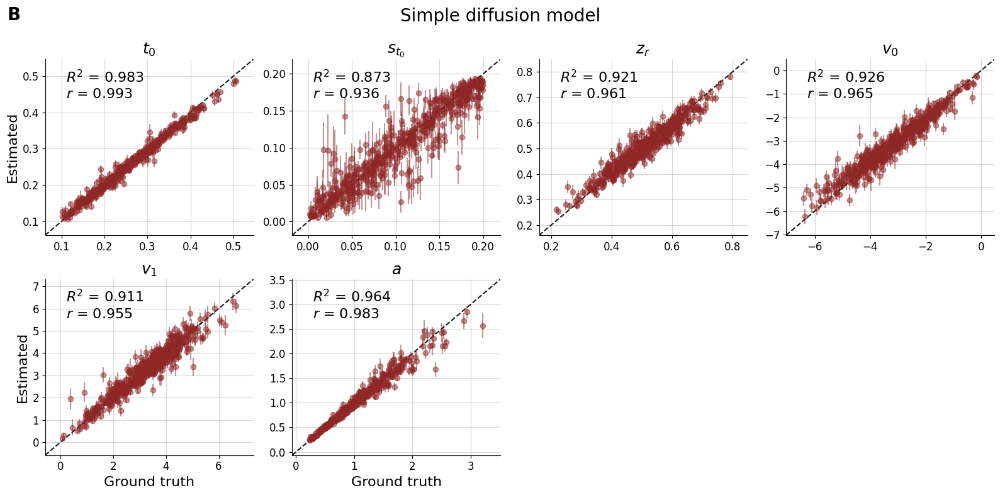

ddm; no_deadline; network 2


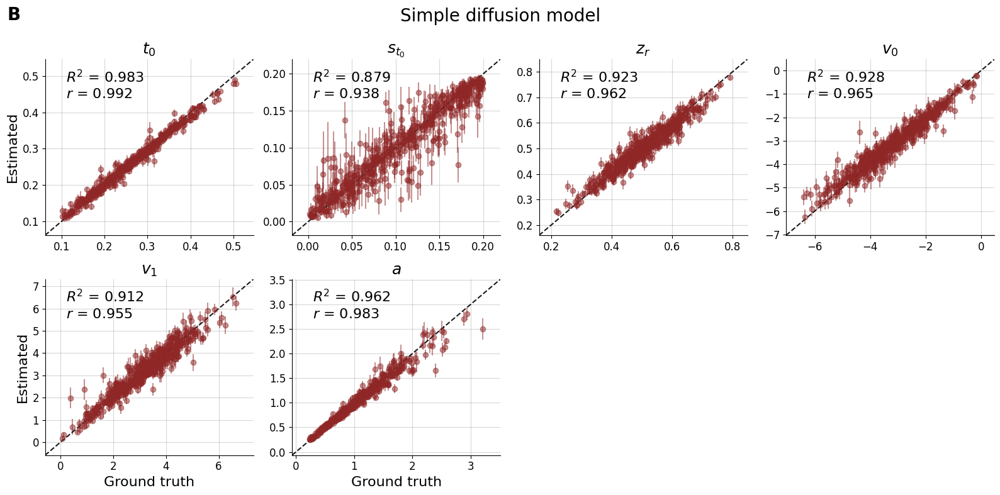

In [28]:
# Median posterior recovery
for c in range(NUM_COMBINATIONS):
    for network in range(NUM_ENSEMBLE_MEMBERS):
        comp_model = "ddm" if val_sims_list[c]["direct_conditions"][0, 1] else "levy"
        condition = "deadline" if val_sims_list[c]["direct_conditions"][0, 2] else "no_deadline"

        # Modify data and parameter labels if comp_model is "ddm"
        if comp_model == "ddm":
            post_samples_mod = post_samples_filtered[network][c]
            post_samples_mod = post_samples_mod[..., :-1]  
            prior_samples_mod = prior_samples[c][..., :-1]        
            param_names = PARAM_LABELS[:6] 
        else:
            post_samples_mod = post_samples[network][c]
            prior_samples_mod = prior_samples[c]
            param_names = PARAM_LABELS
        
        f = bf.diagnostics.plot_recovery(post_samples_mod, prior_samples_mod, param_names=param_names,
                                        n_row=2, n_col=4)
        
        f.suptitle(f'Simple {model_map.get(comp_model)} model', fontsize=20, y=0.975)
        annotation = "A" if comp_model == "levy" else "B"
        f.text(0.01, 0.95, annotation, fontsize=20, ha='left', fontweight='bold')
        plt.tight_layout(rect=[0, 0, 1, 0.98])

        filename = f"figures/param_recovery_net{network+1}_{comp_model}_{condition}.png"
        plt.savefig(filename, transparent=False, bbox_inches='tight', dpi=MY_DPI)

        print(f'{comp_model}; {condition}; network {network + 1}')
        plt.show()

levy; no deadline; network 1


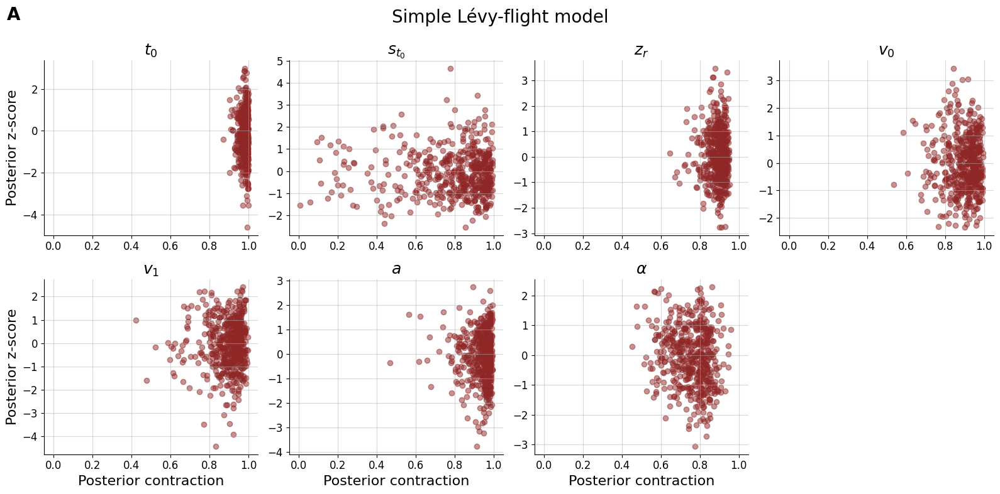

levy; no deadline; network 2


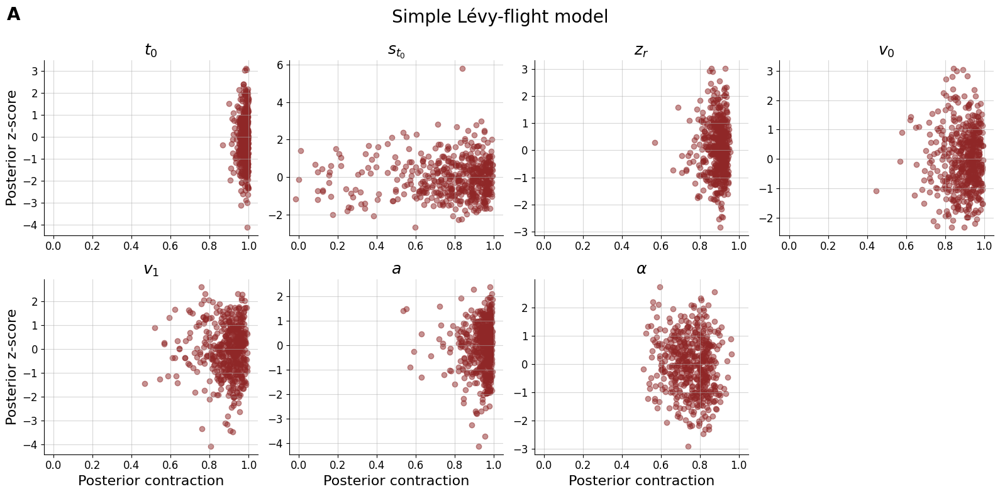

ddm; no deadline; network 1


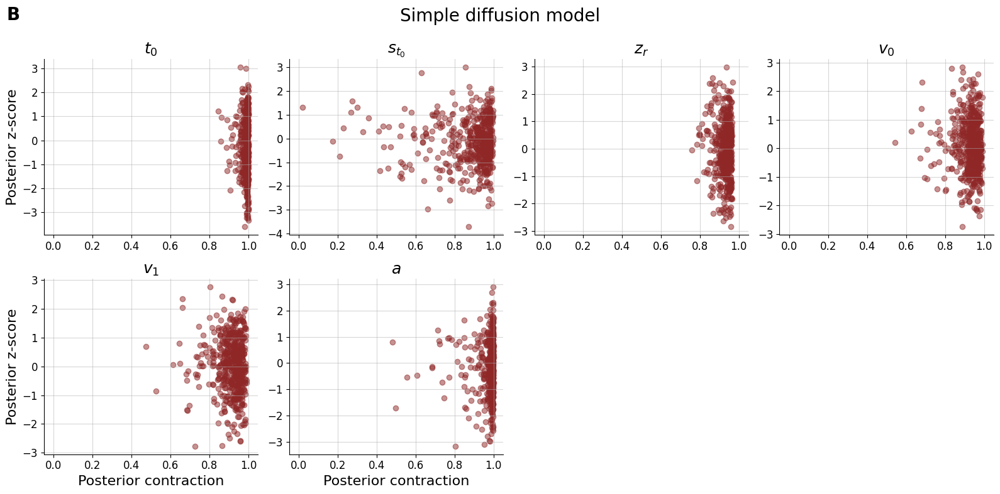

ddm; no deadline; network 2


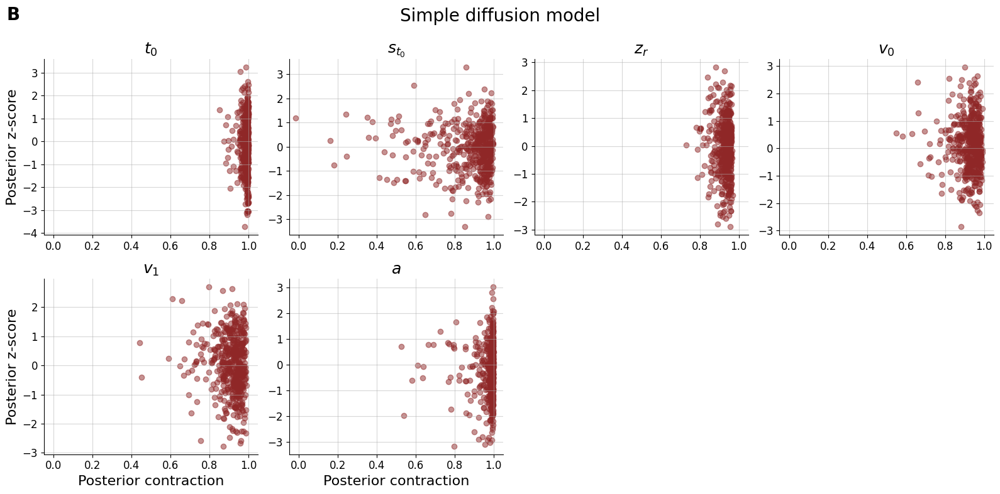

In [29]:
# Posterior contraction
for c in range(NUM_COMBINATIONS):
    for network in range(NUM_ENSEMBLE_MEMBERS):
        comp_model = "ddm" if val_sims_list[c]["direct_conditions"][0, 1] else "levy"
        condition = "deadline" if val_sims_list[c]["direct_conditions"][0, 2] else "no deadline"

        # Modify data and parameter labels if comp_model is "ddm"
        if comp_model == "ddm":
            post_samples_mod = post_samples[network][c][..., :-1] 
            prior_samples_mod = prior_samples[c][..., :-1]
            param_names = PARAM_LABELS[:6] 
        else:
            post_samples_mod = post_samples[network][c]
            prior_samples_mod = prior_samples[c]
            param_names = PARAM_LABELS
            
        f = bf.diagnostics.plot_z_score_contraction(post_samples_mod, prior_samples_mod, 
                                                    param_names=param_names,
                                                   n_row=2, n_col=4
                                                   )

        f.suptitle(f'Simple {model_map.get(comp_model)} model', fontsize=20, y=0.975)
        annotation = "A" if comp_model == "levy" else "B"
        f.text(0.01, 0.95, annotation, fontsize=20, ha='left', fontweight='bold')
        plt.tight_layout(rect=[0, 0, 1, 0.98])

        filename = f"figures/contraction_net{network+1}_{comp_model}_{condition}.png"
        plt.savefig(filename, transparent=False, bbox_inches='tight', dpi=MY_DPI)

        print(f'{comp_model}; {condition}; network {network + 1}')
        plt.show()

# Prediction on Empirical Data

**Overview of Instructions and Feedback given to Participants in the Test Phase**

| Condition         | Instruction                                                                                      | Feedback                                          | Trial                                            |
|-------------------|--------------------------------------------------------------------------------------------------|--------------------------------------------------|--------------------------------------------------|
| Accuracy          | Respond as accurately as possible.                                                                | “Correct!” (correct) or none (incorrect)          | After response submission                        |
| Implicit deadline | You will have less than a second to make your decision.<br>Respond as fast as possible.           | “Too slow!” (too slow) or none (in time)          | After response submission                        |
| Explicit deadline | You will have less than a second to make your decision.<br>Respond as fast as possible.           | “Too slow!” (too slow) or none (in time)          | After response submission or 500 ms, whichever came first |


## Estimate Parameters

### Set Constants

In [30]:
# Select all contexts
SIMULATOR_CONTEXTS = ['no_deadline', 'deadline']

# Conditions
conditions = ['acc', 'implicitDeadline', 'explicitDeadline']

# Get abbreviated name (i.e., for both contexts)
end_index = MY_NAME.find('it_') + len('it_')
MY_ABBR_NAME = MY_NAME[:end_index-1]
MY_ABBR_NAME

'ttj_presimulation_250ep_10000it'

In [31]:
# Set paths
DATA_PATH = "data/individual_data/"
ESTIM_ROOT_PATH = "estimates_param_estim/estimates_" + MY_ABBR_NAME
SIM_ROOT_PATH = "estimates_param_estim/simulates_" + MY_ABBR_NAME
ESTIM_ROOT_PATH

'estimates_param_estim/estimates_ttj_presimulation_250ep_10000it'

In [32]:
# Ensure the estimates directory exists
os.makedirs(ESTIM_ROOT_PATH, exist_ok=True)

for network in range(NUM_ENSEMBLE_MEMBERS):
    for p in PRIOR_CONTEXTS:
        for s in SIMULATOR_CONTEXTS:
            estimates_path = f'{ESTIM_ROOT_PATH}/estimates_net{network + 1}_{p}_{s}.csv'
            
            if not os.path.exists(estimates_path):
                amortizer, trainer, optimizer = setup_network(checkpoint_path=f"checkpoint_{MY_ABBR_NAME}_levy_ddm_{s}/net{network + 1}")
                
                # Select data files based on simulator context
                if s == "no_deadline":
                    datafiles = glob.glob(DATA_PATH + '*.csv')
                elif s == "deadline":
                    datafiles = glob.glob(DATA_PATH+'*explicitDeadline.csv') 

                estimates = []
                for datafile in datafiles:  
                    # Load and preprocess data
                    raw_data = pd.read_csv(datafile)
                    
                    if ("explicitDeadline" in datafile) & (s == "no_deadline"):
                        raw_data = raw_data.loc[raw_data['RT'] != 0] #Delete timeouts

                    data = np.expand_dims(raw_data.to_numpy(), 0)
                    data = np.delete(data, 1, axis = 2) #Delete letter column
                    #Negative rts = letter/0, positive RTs = number/1
                    
                    # Prepare direct conditions based on contexts
                    num_obs = int(np.sqrt(data.shape[1]))
                    prior_context = 0 if p == "levy" else 1
                    sim_context = 0 if s == "no_deadline" else 1
                    direct_conditions = np.array([num_obs, prior_context, sim_context])[np.newaxis, ...]
    
                    # Get posterior samples and calculate estimates
                    thisdict = {"summary_conditions": data, "direct_conditions": direct_conditions}
                    samples = amortizer.sample(thisdict, n_samples=5000, to_numpy=True)
                    theta_hat = samples.mean(axis=0)
                    estimates.append(theta_hat)
    
                # Save parameter estimates to CSV
                df = pd.DataFrame(np.array(estimates), columns=PARAM_NAMES)
                df['file'] = [os.path.basename(filepath) for filepath in datafiles]  
                df[['pp', 'condition']] = df['file'].str.extract(r'file(\d+)_(acc|implicitDeadline|explicitDeadline)\.csv')
                df.to_csv(estimates_path, index=False)
                print(f"Saved estimates to {estimates_path}")
            else:
                print(f"{estimates_path} already exists")

estimates_param_estim/estimates_ttj_presimulation_250ep_10000it/estimates_net1_levy_no_deadline.csv already exists
estimates_param_estim/estimates_ttj_presimulation_250ep_10000it/estimates_net1_levy_deadline.csv already exists
estimates_param_estim/estimates_ttj_presimulation_250ep_10000it/estimates_net1_ddm_no_deadline.csv already exists
estimates_param_estim/estimates_ttj_presimulation_250ep_10000it/estimates_net1_ddm_deadline.csv already exists
estimates_param_estim/estimates_ttj_presimulation_250ep_10000it/estimates_net2_levy_no_deadline.csv already exists
estimates_param_estim/estimates_ttj_presimulation_250ep_10000it/estimates_net2_levy_deadline.csv already exists
estimates_param_estim/estimates_ttj_presimulation_250ep_10000it/estimates_net2_ddm_no_deadline.csv already exists
estimates_param_estim/estimates_ttj_presimulation_250ep_10000it/estimates_net2_ddm_deadline.csv already exists


### Example

In [33]:
#Example sample 
p = "levy"
s = "no_deadline"
network = 0
amortizer, trainer, optimizer = setup_network(checkpoint_path=f"checkpoint_{MY_ABBR_NAME}_levy_ddm_{s}/net{network + 1}")
datafile = DATA_PATH + 'file1_acc.csv'
raw_data = pd.read_csv(datafile)
data = np.expand_dims(raw_data.to_numpy(), 0)
data = np.delete(data, 1, axis = 2)
num_obs = int(np.sqrt(data.shape[1]))
prior_context = 0 if p == "levy" else 1
sim_context = 0 if s == "no_deadline" else 1
direct_conditions = np.array([num_obs, prior_context, sim_context])[np.newaxis, ...]
thisdict = {"summary_conditions": data, "direct_conditions": direct_conditions}
samples = amortizer.sample(thisdict, n_samples=5000, to_numpy=True)

INFO:root:Loaded loss history from checkpoint_ttj_presimulation_250ep_10000it_levy_ddm_no_deadline/net1/history_250.pkl.
INFO:root:Networks loaded from checkpoint_ttj_presimulation_250ep_10000it_levy_ddm_no_deadline/net1/ckpt-250
INFO:root:Performing a consistency check with provided components...
INFO:root:Done.


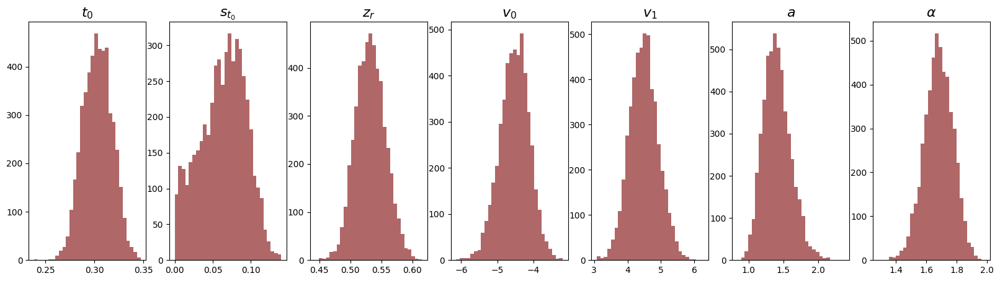

In [34]:
fig, axes = plt.subplots(nrows=1, ncols=len(PARAM_LABELS), figsize=(20, 5))

# Plotting histograms for each feature
for i in range(len(PARAM_NAMES)):
    axes[i].hist(samples[:, i], bins=30, color="#8f2727", alpha=0.7)
    axes[i].set_title(PARAM_LABELS[i], fontsize=16)

## Inspect Parameter Point Estimates

### By Table 

In [35]:
df_all = pd.DataFrame()  

for network in range(NUM_ENSEMBLE_MEMBERS):
    for p in PRIOR_CONTEXTS:
        for s in SIMULATOR_CONTEXTS:
            estimates_path = f'{ESTIM_ROOT_PATH}/estimates_net{network+1}_{p}_{s}.csv'
            df = pd.read_csv(estimates_path)
            df['net'] = network+1
            df['model'] = p
            df['sim'] = s
            df_all = pd.concat([df_all, df], ignore_index=True) 

df_all['condition'] = pd.Categorical(df_all['condition'], 
                                     categories=["acc", "implicitDeadline", "explicitDeadline"], ordered=True)
df_all['model'] = pd.Categorical(df_all['model'], categories=["levy", "ddm"], ordered=True)
df_all['sim'] = pd.Categorical(df_all['sim'], categories=['no_deadline', 'deadline'], ordered=True)
df_all['net'] = pd.Categorical(df_all['net'], ordered=True)
df_all.loc[df_all['model'] == 'ddm', 'alpha'] = np.nan
df_all

,t0,st0,zr,v0,v1,a,alpha,file,pp,condition,net,model,sim
0,0.236076,0.120492,0.432801,-1.308938,1.347931,0.231051,1.025284,file117_explicitDeadline.csv,117,explicitDeadline,1,levy,no_deadline
1,0.252507,0.137756,0.565928,-1.630066,1.189829,0.385635,0.985867,file254_explicitDeadline.csv,254,explicitDeadline,1,levy,no_deadline
2,0.330883,0.176483,0.485024,-3.129572,3.188491,0.897688,1.457372,file236_acc.csv,236,acc,1,levy,no_deadline
3,0.369161,0.130292,0.491780,-4.550118,4.602611,1.119492,1.726676,file142_acc.csv,142,acc,1,levy,no_deadline
4,0.351842,0.100685,0.563775,-4.425190,3.321235,0.725169,1.581664,file147_acc.csv,147,acc,1,levy,no_deadline
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1671,0.285849,0.155574,0.453953,-2.579986,3.381027,0.660191,NaN,file125_explicitDeadline.csv,125,explicitDeadline,2,ddm,deadline
1672,0.262534,0.163259,0.477497,-1.806372,2.084923,0.682673,NaN,file238_explicitDeadline.csv,238,explicitDeadline,2,ddm,deadline
1673,0.258566,0.191803,0.477312,-1.444599,1.515789,0.627226,NaN,file289_explicitDeadline.csv,289,explicitDeadline,2,ddm,deadline
1674,0.322407,0.130873,0.548967,-4.389529,3.634224,0.555027,NaN,file218_explicitDeadline.csv,218,explicitDeadline,2,ddm,deadline


In [36]:
for network in range(NUM_ENSEMBLE_MEMBERS):
    print("\nNetwork", network+1)
    df_net = df_all.loc[df_all['net'] == network+1]
    summary_table = (
        df_net.groupby(['model', 'sim', 'condition'], observed=False)[['alpha', 'a', 'zr', 'v0', 'v1', 't0', 'st0']]
        .agg(['mean', 'std'])
        .round(3)
        .reset_index()
    )
    display(summary_table.drop([3, 4, 9, 10], axis=0))

    summary_table = (
        df_net.groupby(['model', 'sim', 'condition'], observed=False)[['alpha', 'a', 'zr', 'v0', 'v1', 't0', 'st0']]
        .agg(['min', 'max'])
        .round(2)
        .reset_index()
    )
    display(summary_table.drop([3, 4, 9, 10], axis=0))


Network 1


model          sim         condition  alpha             a            zr  \
                                          mean    std   mean    std   mean   
0   levy  no_deadline               acc  1.645  0.184  0.996  0.268  0.492   
1   levy  no_deadline  implicitDeadline  1.251  0.198  0.530  0.168  0.492   
2   levy  no_deadline  explicitDeadline  1.136  0.165  0.390  0.147  0.492   
5   levy     deadline  explicitDeadline  1.298  0.207  0.477  0.132  0.484   
6    ddm  no_deadline               acc    NaN    NaN  0.984  0.218  0.492   
7    ddm  no_deadline  implicitDeadline    NaN    NaN  0.699  0.128  0.494   
8    ddm  no_deadline  explicitDeadline    NaN    NaN  0.568  0.110  0.494   
11   ddm     deadline  explicitDeadline    NaN    NaN  0.654  0.089  0.491   

              v0            v1            t0           st0         
      std   mean    std   mean    std   mean    std   mean    std  
0   0.048 -3.437  0.835  3.408  0.812  0.338  0.036  0.097  0.034  
1   0.055 -2.433  0.767  2.409  0.843  0.293  0.033  0.121  0.030  
2   0.061 -2.331  0.864  2.295  0.914  0.292  0.032  0.127  0.024  
5   0.068 -2.078  0.764  2.191  0.833  0.287  0.032  0.118  0.035  
6   0.048 -3.680  0.844  3.630  0.811  0.349  0.037  0.120  0.034  
7   0.050 -3.280  0.745  3.141  0.848  0.299  0.034  0.135  0.029  
8   0.056 -3.503  0.928  3.303  1.039  0.297  0.032  0.137  0.025  
11  0.058 -2.810  0.823  2.932  0.955  0.294  0.034  0.141  0.034

model          sim         condition alpha           a          zr        \
                                          min   max   min   max   min   max   
0   levy  no_deadline               acc  1.05  1.95  0.38  1.83  0.31  0.60   
1   levy  no_deadline  implicitDeadline  1.00  1.74  0.29  1.20  0.33  0.61   
2   levy  no_deadline  explicitDeadline  0.98  1.79  0.20  0.97  0.34  0.65   
5   levy     deadline  explicitDeadline  1.00  1.86  0.24  0.84  0.32  0.68   
6    ddm  no_deadline               acc   NaN   NaN  0.56  1.67  0.33  0.60   
7    ddm  no_deadline  implicitDeadline   NaN   NaN  0.49  1.23  0.34  0.60   
8    ddm  no_deadline  explicitDeadline   NaN   NaN  0.41  1.02  0.35  0.64   
11   ddm     deadline  explicitDeadline   NaN   NaN  0.48  0.90  0.34  0.65   

      v0          v1          t0         st0        
     min   max   min   max   min   max   min   max  
0  -5.41 -1.14  1.01  5.29  0.28  0.44  0.01  0.18  
1  -4.32 -0.65  0.61  4.77  0.19  0.37  0.05  0.19  
2  -4.79 -0.72  0.41  4.74  0.20  0.35  0.07  0.19  
5  -4.83 -0.86  0.14  4.11  0.20  0.37  0.05  0.19  
6  -5.91 -1.19  1.04  5.67  0.28  0.46  0.02  0.19  
7  -4.92 -1.04  0.93  5.46  0.19  0.38  0.07  0.20  
8  -5.45 -1.56  0.59  5.59  0.20  0.36  0.07  0.19  
11 -5.00 -1.15  0.27  4.75  0.19  0.38  0.06  0.20


Network 2


model          sim         condition  alpha             a            zr  \
                                          mean    std   mean    std   mean   
0   levy  no_deadline               acc  1.643  0.181  1.002  0.272  0.494   
1   levy  no_deadline  implicitDeadline  1.293  0.188  0.530  0.154  0.484   
2   levy  no_deadline  explicitDeadline  1.182  0.167  0.410  0.158  0.473   
5   levy     deadline  explicitDeadline  1.307  0.205  0.457  0.138  0.485   
6    ddm  no_deadline               acc    NaN    NaN  0.969  0.217  0.493   
7    ddm  no_deadline  implicitDeadline    NaN    NaN  0.664  0.111  0.485   
8    ddm  no_deadline  explicitDeadline    NaN    NaN  0.558  0.141  0.479   
11   ddm     deadline  explicitDeadline    NaN    NaN  0.643  0.086  0.486   

              v0            v1            t0           st0         
      std   mean    std   mean    std   mean    std   mean    std  
0   0.048 -3.471  0.840  3.424  0.821  0.338  0.036  0.096  0.033  
1   0.061 -2.454  0.780  2.471  0.806  0.295  0.033  0.122  0.030  
2   0.074 -2.374  0.811  2.416  0.887  0.292  0.037  0.131  0.027  
5   0.070 -2.064  0.837  2.102  0.884  0.288  0.031  0.121  0.032  
6   0.049 -3.716  0.848  3.682  0.844  0.352  0.036  0.124  0.034  
7   0.056 -3.208  0.852  3.221  0.905  0.303  0.033  0.144  0.031  
8   0.066 -3.456  0.984  3.478  1.189  0.298  0.037  0.148  0.027  
11  0.061 -2.774  0.924  2.851  0.977  0.294  0.032  0.138  0.032

model          sim         condition alpha           a          zr        \
                                          min   max   min   max   min   max   
0   levy  no_deadline               acc  1.09  1.94  0.40  1.84  0.29  0.60   
1   levy  no_deadline  implicitDeadline  1.02  1.78  0.31  1.11  0.30  0.62   
2   levy  no_deadline  explicitDeadline  1.01  1.80  0.23  0.97  0.32  0.68   
5   levy     deadline  explicitDeadline  1.00  1.84  0.23  0.90  0.33  0.67   
6    ddm  no_deadline               acc   NaN   NaN  0.56  1.64  0.31  0.60   
7    ddm  no_deadline  implicitDeadline   NaN   NaN  0.49  1.10  0.32  0.61   
8    ddm  no_deadline  explicitDeadline   NaN   NaN  0.39  1.11  0.33  0.67   
11   ddm     deadline  explicitDeadline   NaN   NaN  0.48  0.92  0.34  0.64   

      v0          v1          t0         st0        
     min   max   min   max   min   max   min   max  
0  -5.28 -1.17  1.05  5.22  0.26  0.44  0.02  0.17  
1  -4.38 -0.66  0.67  4.83  0.19  0.37  0.06  0.20  
2  -4.83 -1.01  0.40  4.77  0.18  0.36  0.06  0.19  
5  -4.84 -0.70  0.20  4.15  0.20  0.37  0.04  0.19  
6  -5.80 -1.21  1.08  5.83  0.28  0.46  0.02  0.19  
7  -4.99 -0.82  0.74  5.65  0.19  0.38  0.08  0.20  
8  -5.56 -1.45  0.41  5.93  0.18  0.37  0.07  0.20  
11 -5.07 -0.92  0.25  4.83  0.20  0.37  0.06  0.20

### Out of bounds?

In [37]:
prior_bounds = {
    'zr': (0.2, 0.8),
    'a': (0, 10),
    'v0': (-18.51, -0.01),
    'v1': (0.01, 18.51),
    't0': (0.1, 1.0),
    'st0': (0.0, 0.2),
    'alpha': (1.0, 2.0)  
}

# Store out-of-bound results
violations = []

for i, row in df_all.iterrows():
    network = row['net']
    model = row['model']
    condition = row['condition']
    simulator = row['sim']
    participant = row['pp']

    for param in PARAM_NAMES:
        if model == 'ddm' and param == 'alpha':
            continue  # skip dummy alpha param in ddm
        
        val = row[param]
        low, high = prior_bounds[param]

        if not (low <= val <= high):
            violations.append({
                'participant': participant,
                'network': network,
                'model': model,
                'sim': simulator,
                'condition': condition,
                'parameter': param,
                'value': val,
                'lower_bound': low,
                'upper_bound': high
            })
            
df_violations = pd.DataFrame(violations)
df_violations

,participant,network,model,sim,condition,parameter,value,lower_bound,upper_bound
0,254,1,levy,no_deadline,explicitDeadline,alpha,0.985867,1.0,2.0
1,73,1,levy,no_deadline,explicitDeadline,alpha,0.983992,1.0,2.0
2,155,1,levy,no_deadline,explicitDeadline,alpha,0.997283,1.0,2.0
3,9,1,levy,no_deadline,explicitDeadline,alpha,0.998159,1.0,2.0
4,45,1,levy,no_deadline,explicitDeadline,alpha,0.997444,1.0,2.0
5,99,1,levy,no_deadline,explicitDeadline,alpha,0.998790,1.0,2.0
6,128,1,levy,no_deadline,explicitDeadline,alpha,0.998808,1.0,2.0
7,61,1,levy,no_deadline,explicitDeadline,alpha,0.987470,1.0,2.0
8,40,1,levy,no_deadline,explicitDeadline,alpha,0.992838,1.0,2.0
9,254,1,levy,deadline,explicitDeadline,alpha,0.995503,1.0,2.0


In [38]:
df_violations_alpha_net1 = df_violations.loc[(df_violations['sim'] == 'no_deadline') & (df_violations['network'] == 1)]
print(len(df_violations_alpha_net1))
print(df_violations_alpha_net1['value'].min())
print(df_violations_alpha_net1['value'].max())
df_violations_alpha_net1['participant'].tolist()

9
0.9839915
0.9988077


[254, 73, 155, 9, 45, 99, 128, 61, 40]

### By Visualization

In [39]:
def apa_tick_formatter(digits=1):
    def formatter(x, _):
        if x == int(x):
            return str(int(x))
        else:
            return f'{x:.{digits}f}'.lstrip('0') 
    return formatter
    
def blend_with_white(color, alpha=0.5):
    original_color = mcolors.to_rgb(color)
    white = (1, 1, 1) 
    blended_color = [alpha * oc + (1 - alpha) * w for oc, w in zip(original_color, white)]
    return mcolors.to_hex(blended_color)

base_palette  = {"acc": "#6B6B6B", "implicitDeadline": "#6A33A2", "explicitDeadline": "teal"} 
#base_palette = {"acc": "#6B6B6B", "implicitDeadline": "#9C1081", "explicitDeadline": "#EC7946"} 
alpha_value = 0.6 
palette = {key: blend_with_white(color, alpha=alpha_value) for key, color in base_palette.items()}

num_params = len(PARAM_NAMES)
condition_order = ["acc", "implicitDeadline", "explicitDeadline"]
condition_labels = ["Accuracy", "Implicit Deadline", "Explicit Deadline"]

simulator_title = "Timeout Modeling"
simulator_labels = ["Absent", "Present"]
model_map_title_case = {'levy': 'Lévy-Flight', 'ddm': 'Diffusion'} 

Network 1


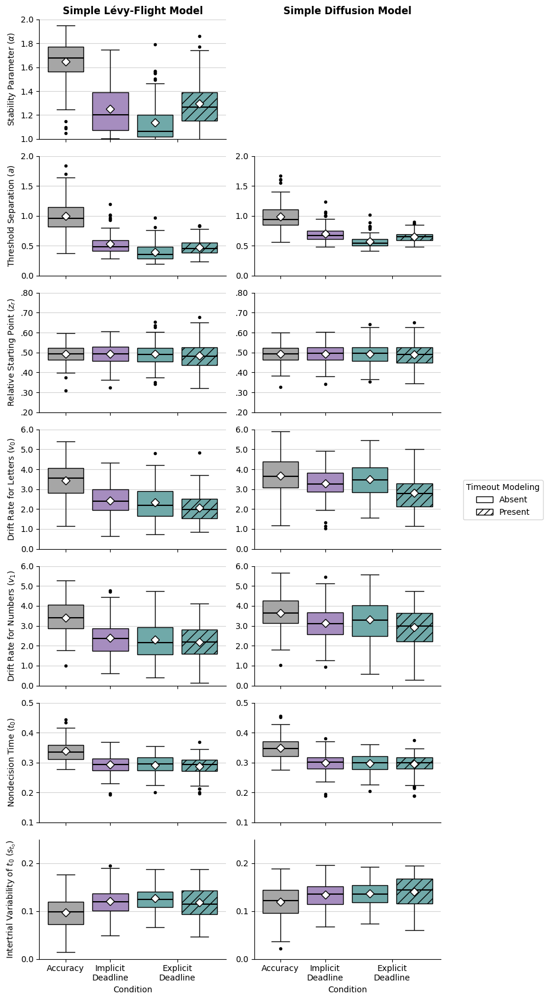

Network 2


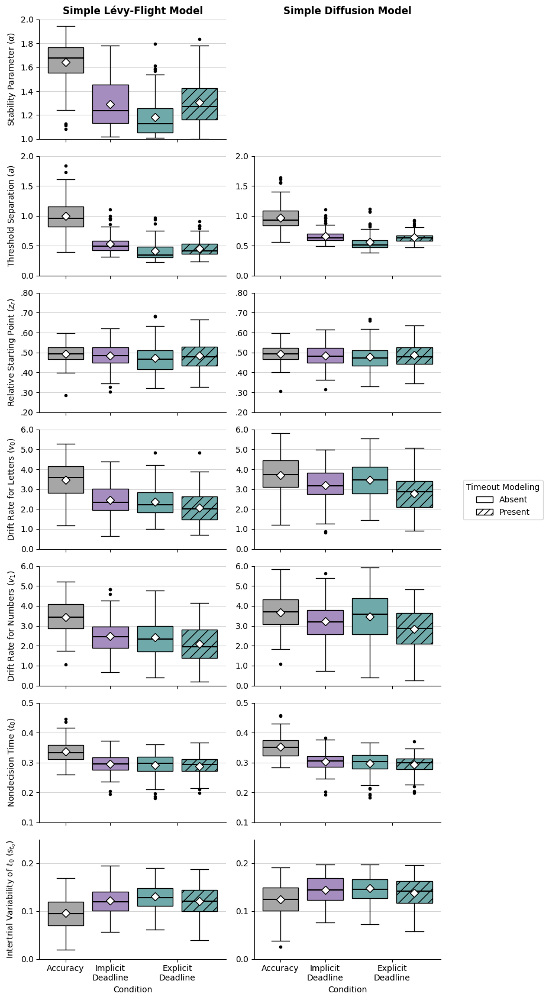

In [40]:
#Only one tick for explicit deadline condition + v0*-1
mixed_condition_labels = condition_labels[:]
mixed_condition_labels.append("Explicit deadline (re)")
mixed_condition_order = ["acc", "implicitDeadline", "explicitDeadline", "Explicit deadline (re)"]
mixed_condition_labels = ["Accuracy", "Implicit Deadline", "Explicit Deadline", "Explicit deadline (re)"]
mixed_palette = palette.copy()
mixed_palette["Explicit deadline (re)"] = mixed_palette["explicitDeadline"] 

re_PARAM_NAMES = ["alpha", "a", "zr", "v0_r", "v1", "t0", "st0"]
fancy_PARAM_LABELS = [r"Stability Parameter ($\alpha$)",
                      r"Threshold Separation ($a$)",
                      r"Relative Starting Point ($z_r$)", 
                       r"Drift Rate for Letters ($v_{0}$)", 
                      r"Drift Rate for Numbers ($v_{1}$)", 
                      r"Nondecision Time ($t_0$)", 
                      r"Intertrial Variability of $t_0$ ($s_{t_0}$)"]
y0_y1_map = {"t0": [.1, .5],
             "st0": [0., .25],
             "zr": [0.2, 0.8],
             "v1": [0., 6.],
             "v0_r": [0., 6.],
             "a": [0., 2.],
             "alpha": [1., 2.]}

for network in range(NUM_ENSEMBLE_MEMBERS):
    print("Network", network+1)
    df_levy = pd.read_csv(f'{ESTIM_ROOT_PATH}/estimates_net{network + 1}_levy_no_deadline.csv')
    df_deadline_levy = pd.read_csv(f'{ESTIM_ROOT_PATH}/estimates_net{network + 1}_levy_deadline.csv')
    df_deadline_levy["condition"] = "Explicit deadline (re)"
    df_levy = pd.concat([df_levy, df_deadline_levy])
    df_levy['v0_r'] = df_levy['v0']*-1
    
    df_ddm = pd.read_csv(f'{ESTIM_ROOT_PATH}/estimates_net{network + 1}_ddm_no_deadline.csv')
    df_deadline_ddm = pd.read_csv(f'{ESTIM_ROOT_PATH}/estimates_net{network + 1}_ddm_deadline.csv')
    df_deadline_ddm["condition"] = "Explicit deadline (re)"
    df_ddm = pd.concat([df_ddm, df_deadline_ddm])
    df_ddm['v0_r'] = df_ddm['v0']*-1
    
    fig, axes = plt.subplots(len(PARAM_NAMES), 2, figsize=(7.5, 17))
    #fig.suptitle(f'Network {network + 1}', fontweight='bold', y=1.02)

    for i, param in enumerate(re_PARAM_NAMES):
        for j, (df, context) in enumerate(zip([df_levy, df_ddm], ["levy", "ddm"])):
            ax = axes[i, j]
            if param == "alpha":
                ax.set_title(f"Simple {model_map_title_case[context]} Model", fontweight='bold') 
            if param == "alpha" and context == "ddm":
                ax.axis('off')  # Turn off axis for this subplot
            else:
                sns.boxplot(x='condition', y=param, hue='condition', data=df,
                            order=mixed_condition_order, palette=mixed_palette, legend=False, ax=ax,
                            flierprops=dict(marker='o', markerfacecolor='black', markeredgecolor="black", markersize=3),
                            whiskerprops=dict(color="black"),
                            boxprops=dict(edgecolor="black"),
                            capprops=dict(color="black"),
                            medianprops=dict(color="black", linewidth=1.5))
    
                hatch_index = mixed_condition_order.index("Explicit deadline (re)")
                num_boxes = len(ax.patches)
                per_condition = num_boxes // len(mixed_condition_order)
                start = hatch_index * per_condition
    
                for patch in ax.patches[start:start + per_condition]:
                    patch.set_hatch('//')
    
                # Set y-axis formatter to one decimal place
                if param=="zr":
                    ax.yaxis.set_major_formatter(FuncFormatter(apa_tick_formatter(digits=2)))
                else: 
                    ax.yaxis.set_major_formatter(ScalarFormatter())
                    ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.1f}'))

                if param=="st0":
                    ax.set_yticks([0, 0.1, 0.2])
                
                ax.set_xticks([0, 1, 2.5])
                if i == len(re_PARAM_NAMES)-1:
                    ax.set_xlabel('Condition')
                    ax.set_xticklabels([label.replace(" ", "\n") for label in mixed_condition_labels[0:3]])
                else:
                    ax.set_xlabel('')
                    ax.set_xticklabels([])
    
                if context=="levy":
                    ax.set_ylabel(f'{fancy_PARAM_LABELS[i]}')
                else: 
                    ax.set_ylabel("")
                ax.set_ylim(y0_y1_map[param])

                means = df.groupby('condition')[param].mean()
                for k, condition in enumerate(mixed_condition_order):
                    mean_value = means[condition]
                    ax.plot(k, mean_value, 'D', markerfacecolor='white', markersize=7, markeredgecolor='black',
                            zorder=3)

                ax.spines['top'].set_visible(False)
                ax.spines['right'].set_visible(False)
                ax.grid(True, which='major', axis='y', color='lightgrey')

    plane_patch = mpatches.Patch(facecolor='white', edgecolor='black', label=simulator_labels[0])
    striped_patch = mpatches.Patch(facecolor='white', edgecolor='black', hatch='///', label=simulator_labels[1])

    fig.legend(handles=[plane_patch, striped_patch], title=simulator_title, #fontsize=14-4, title_fontsize=14-2, 
               loc='center right', bbox_to_anchor=(1.24, 0.5), frameon=True)
    
    plt.tight_layout()
    fig.subplots_adjust(right=1)  
    plt.savefig(f"figures/params_net{network+1}.png", dpi=MY_DPI, transparent=True, bbox_inches='tight')
    plt.show()

# Visualization Priors vs. Posteriors

In [41]:
def my_2d_f(p, s, network, file, n_samples = 1000):
    checkpoint = f"checkpoint_{MY_ABBR_NAME}_levy_ddm_{s}/net{network + 1}"
    amortizer, trainer, optimizer = setup_network(checkpoint_path=checkpoint)
    datafile = DATA_PATH + file
    raw_data = pd.read_csv(datafile)
    data = np.expand_dims(raw_data.to_numpy(), 0)
    data = np.delete(data, 1, axis=2)
    if ("explicitDeadline" in datafile) & (s == "no_deadline"):
        raw_data = raw_data.loc[raw_data['RT'] != 0] #Delete timeouts
    num_obs = int(np.sqrt(data.shape[1]))
    prior_context = 0 if p == "levy" else 1
    sim_context = 0 if s == "no_deadline" else 1
    direct_conditions = np.array([num_obs, prior_context, sim_context])[np.newaxis, ...]

    thisdict = {"summary_conditions": data, "direct_conditions": direct_conditions}
    samples = amortizer.sample(thisdict, n_samples=n_samples, to_numpy=True)

    PRIOR_CONFIGS = {
        "levy": bf.simulation.Prior(
            batch_prior_fun=partial(prior_simulator_functions.levy_prior, fix_alpha=False),
            param_names=PARAM_NAMES
        ),
        "ddm": bf.simulation.Prior(
            batch_prior_fun=partial(prior_simulator_functions.levy_prior, fix_alpha=True),
            param_names=PARAM_NAMES
        ),
    }
    SIMULATOR_CONFIGS = {
        "no_deadline": bf.simulation.Simulator(
            batch_simulator_fun=partial(prior_simulator_functions.batch_simulator, deadline=False)
        ),
        "deadline": bf.simulation.Simulator(
            batch_simulator_fun=partial(prior_simulator_functions.batch_simulator, deadline=True)
        ),
    }

    prior = PRIOR_CONFIGS[p]
    simulator = SIMULATOR_CONFIGS[s]
    generative_model_2d = bf.simulation.GenerativeModel(
        prior=prior, simulator=simulator, skip_test=True
    )

    print("Example for:", p, s, "network", network + 1)
    f = bf.diagnostics.plot_posterior_2d(samples, generative_model_2d.prior)

INFO:root:Loaded loss history from checkpoint_ttj_presimulation_250ep_10000it_levy_ddm_no_deadline/net1/history_250.pkl.
INFO:root:Networks loaded from checkpoint_ttj_presimulation_250ep_10000it_levy_ddm_no_deadline/net1/ckpt-250
INFO:root:Performing a consistency check with provided components...
INFO:root:Done.


Example for: ddm no_deadline network 1


/home/administrator/miniconda3/envs/bf/lib/python3.10/site-packages/seaborn/axisgrid.py:1615: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=x, y=y, **kwargs)
/home/administrator/miniconda3/envs/bf/lib/python3.10/site-packages/seaborn/axisgrid.py:1615: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=x, y=y, **kwargs)
/home/administrator/miniconda3/envs/bf/lib/python3.10/site-packages/seaborn/axisgrid.py:1615: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=x, y=y, **kwargs)
/home/administrator/miniconda3/envs/bf/lib/python3.10/site-packages/seaborn/axisgrid.py:1615: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=x, y=y, **kwargs)
/home/administra

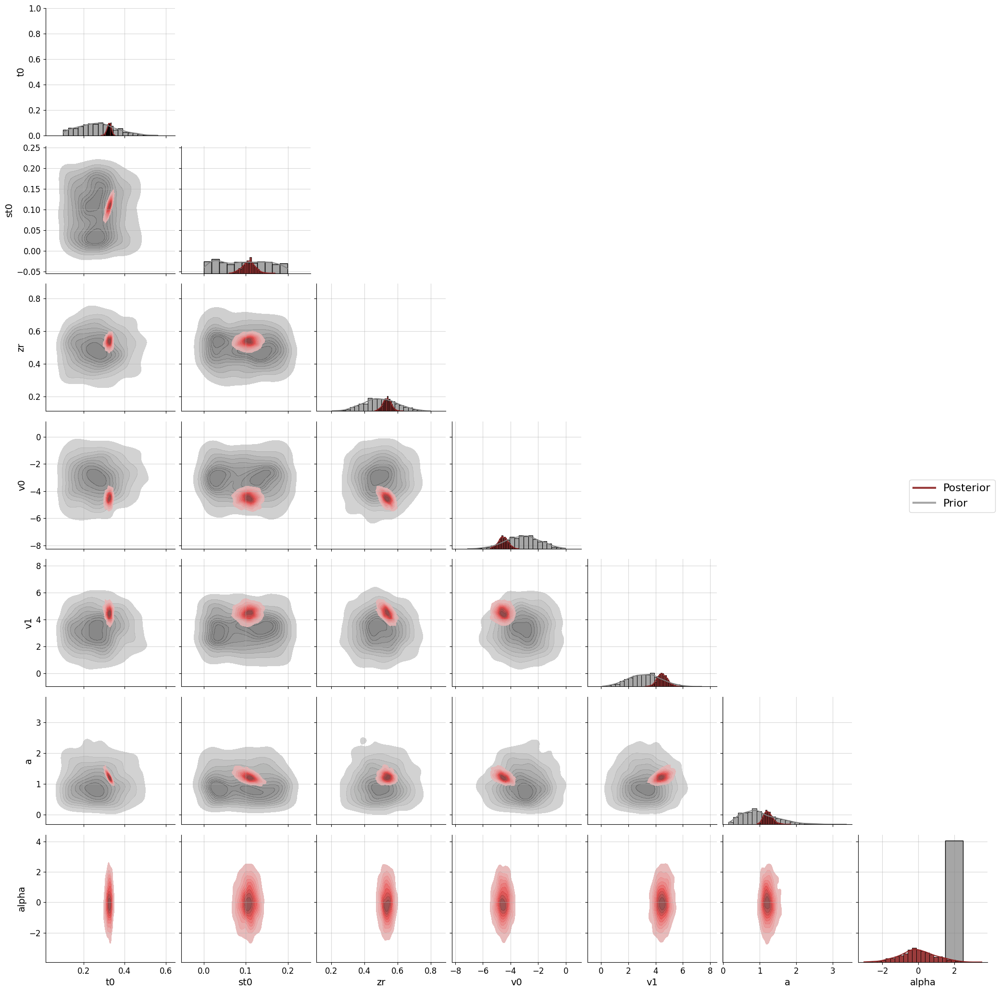

In [42]:
#Example sample 
my_2d_f(p="ddm", s="no_deadline", network=0, file='file1_acc.csv')

INFO:root:Loaded loss history from checkpoint_ttj_presimulation_250ep_10000it_levy_ddm_no_deadline/net1/history_250.pkl.
INFO:root:Networks loaded from checkpoint_ttj_presimulation_250ep_10000it_levy_ddm_no_deadline/net1/ckpt-250
INFO:root:Performing a consistency check with provided components...
INFO:root:Done.


Example for: levy no_deadline network 1


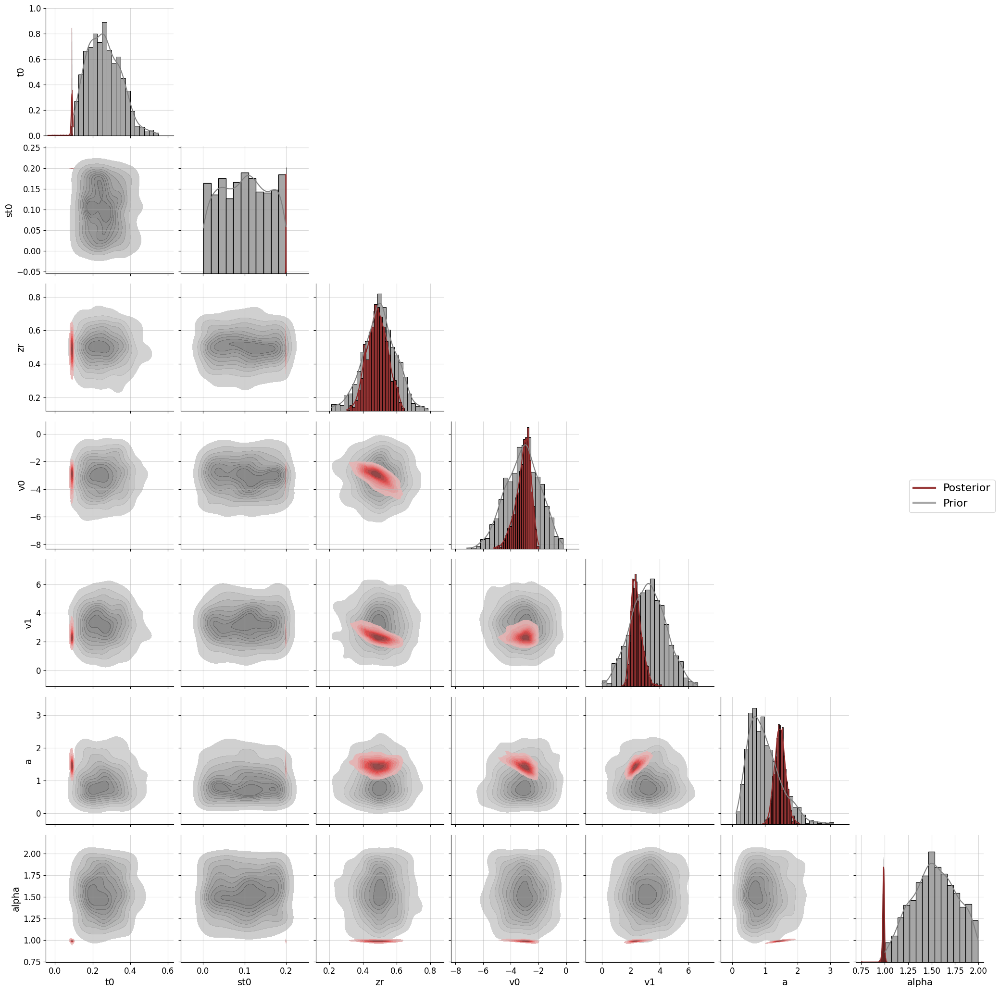

In [43]:
#Example sample 
my_2d_f(p="levy", s="no_deadline", network=0, file='file73_explicitDeadline.csv')

# Ensemble Agreement

In [44]:
def plot_ensemble_agreement(
    net1_estimates,
    net2_estimates,
    param_names=None,
    fig_size=None,
    label_fontsize=16,
    title_fontsize=18,
    metric_fontsize=16,
    tick_fontsize=12,
    add_corr=True,
    add_r2=True,
    color="#8f2727",
    n_col=None,
    n_row=None,
    xlabel="Network 1",
    ylabel="Network 2",
    **kwargs,
):
    """ Alters bf.diagnostics.plot_recovery to show the degree of agreement between two ensemble members."""

    # Determine n params and param names if None given
    n_params = net1_estimates.shape[-1]
    if param_names is None:
        param_names = [f"$\\theta_{{{i}}}$" for i in range(1, n_params + 1)]

    # Determine number of rows and columns for subplots based on inputs
    if n_row is None and n_col is None:
        n_row = int(np.ceil(n_params / 6))
        n_col = int(np.ceil(n_params / n_row))
    elif n_row is None and n_col is not None:
        n_row = int(np.ceil(n_params / n_col))
    elif n_row is not None and n_col is None:
        n_col = int(np.ceil(n_params / n_row))

    # Initialize figure
    if fig_size is None:
        fig_size = (int(4 * n_col), int(4 * n_row))
    f, axarr = plt.subplots(n_row, n_col, figsize=fig_size)
    # turn axarr into 1D list
    if n_col > 1 or n_row > 1:
        axarr_it = axarr.flat
    else:
        # for 1x1, axarr is not a list -> turn it into one for use with enumerate
        axarr_it = [axarr]

    for i, ax in enumerate(axarr_it):
        if i >= n_params:
            break

        # Add scatter and error bars
        _ = ax.scatter(net1_estimates[:, i], net2_estimates[:, i], alpha=0.5, color=color, **kwargs)

        # Make plots quadratic to avoid visual illusions
        lower = min(net1_estimates[:, i].min(), net2_estimates[:, i].min())
        upper = max(net1_estimates[:, i].max(), net2_estimates[:, i].max())
        eps = (upper - lower) * 0.1
        ax.set_xlim([lower - eps, upper + eps])
        ax.set_ylim([lower - eps, upper + eps])
        ax.plot(
            [ax.get_xlim()[0], ax.get_xlim()[1]],
            [ax.get_ylim()[0], ax.get_ylim()[1]],
            color="black",
            alpha=0.9,
            linestyle="dashed",
        )

        # Add optional metrics and title
        if add_r2:
            r2 = r2_score(net1_estimates[:, i], net2_estimates[:, i])
            ax.text(
                0.1,
                0.9,
                "$R^2$ = {:.3f}".format(r2),
                horizontalalignment="left",
                verticalalignment="center",
                transform=ax.transAxes,
                size=metric_fontsize,
            )
        if add_corr:
            corr = np.corrcoef(net1_estimates[:, i], net2_estimates[:, i])[0, 1]
            ax.text(
                0.1,
                0.8,
                "$r$ = {:.3f}".format(corr),
                horizontalalignment="left",
                verticalalignment="center",
                transform=ax.transAxes,
                size=metric_fontsize,
            )
        ax.set_title(param_names[i], fontsize=title_fontsize)

        # Prettify
        sns.despine(ax=ax)
        ax.grid(alpha=0.5)
        ax.tick_params(axis="both", which="major", labelsize=tick_fontsize)
        ax.tick_params(axis="both", which="minor", labelsize=tick_fontsize)

    # Only add x-labels to the bottom row
    bottom_row = axarr if n_row == 1 else axarr[0] if n_col == 1 else axarr[n_row - 1, :]
    for _ax in bottom_row:
        _ax.set_xlabel(xlabel, fontsize=label_fontsize)

    # Only add y-labels to right left-most row
    if n_row == 1:  # if there is only one row, the ax array is 1D
        axarr[0].set_ylabel(ylabel, fontsize=label_fontsize)
    # If there is more than one row, the ax array is 2D
    else:
        for _ax in axarr[:, 0]:
            _ax.set_ylabel(ylabel, fontsize=label_fontsize)

    # Remove unused axes entirely
    for _ax in axarr_it[n_params:]:
        _ax.remove()

    f.tight_layout()
    return f

levy; no_deadline


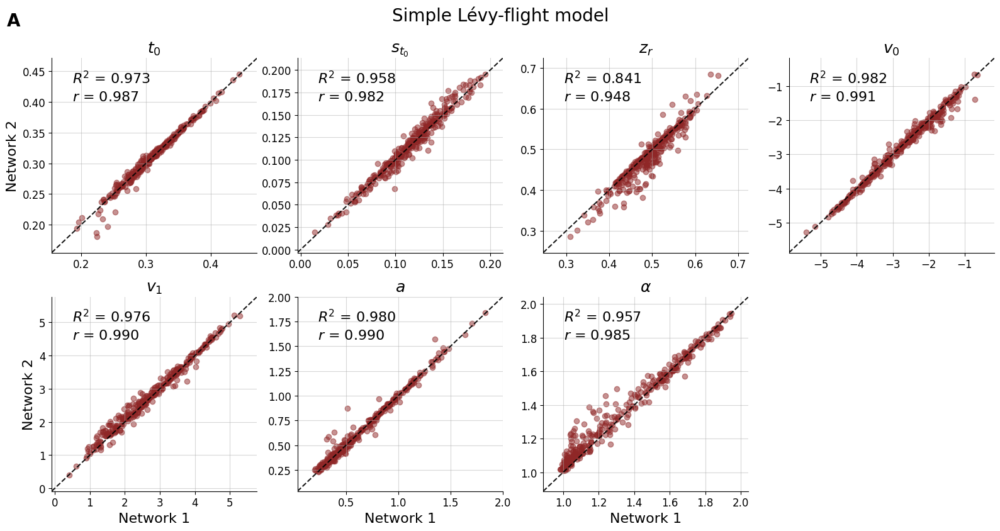

levy; deadline


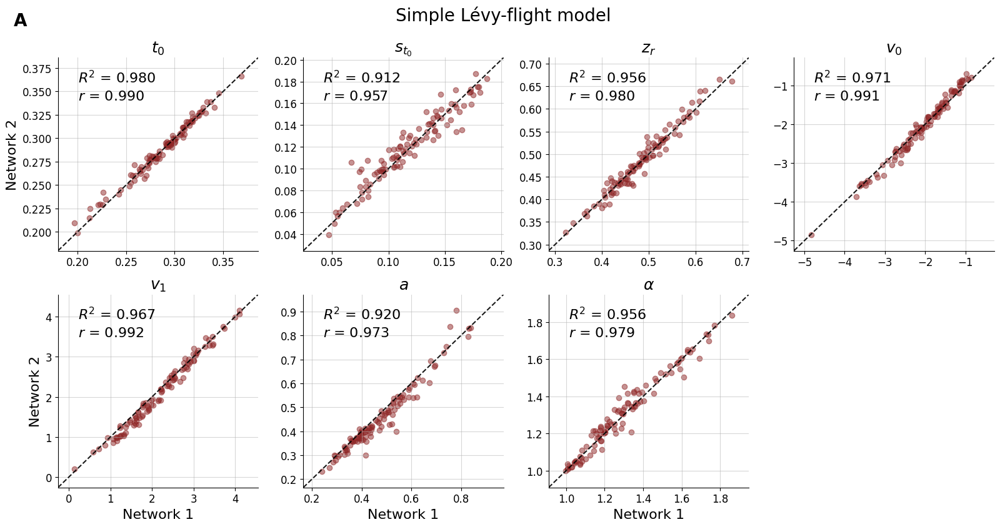

ddm; no_deadline


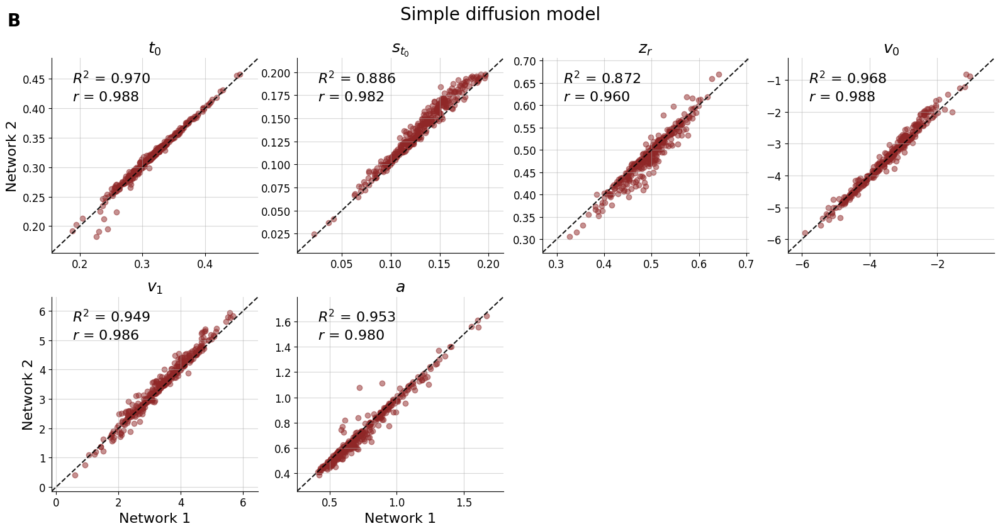

ddm; deadline


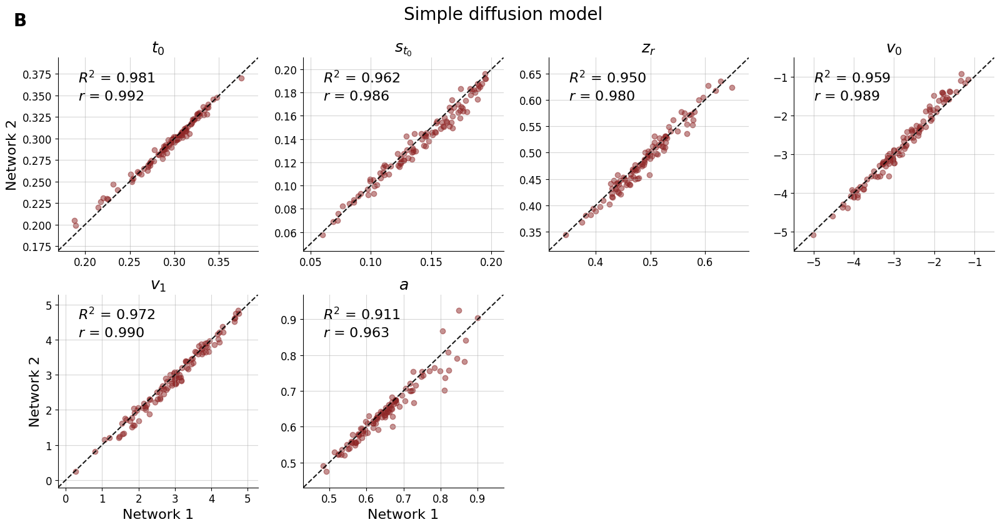

In [45]:
for i, p in enumerate(PRIOR_CONTEXTS):
    for j, s in enumerate(SIMULATOR_CONTEXTS):

        # Load estimates that contain exactly p and s
        net1_pred = pd.read_csv(f"{ESTIM_ROOT_PATH}/estimates_net1_{p}_{s}.csv", 
                        index_col='pp')#.drop(columns=['file', 'condition'], axis=1)
        net2_pred = pd.read_csv(f"{ESTIM_ROOT_PATH}/estimates_net2_{p}_{s}.csv", 
                        index_col='pp')#.drop(columns=['file', 'condition'], axis=1)

        # Common columns to drop
        columns_to_drop = ['file', 'condition']
        
        # Add 'alpha' to the list if p is "ddm"
        if p == "ddm":
            columns_to_drop.append('alpha')
        
        # Drop the columns from both dataframes
        net1_pred = net1_pred.drop(columns=columns_to_drop, axis=1)
        net2_pred = net2_pred.drop(columns=columns_to_drop, axis=1)
               
        my_param_labels = PARAM_LABELS#[:6] + [r"$\alpha$ dummy"] if p == "ddm" else PARAM_LABELS
        
        # Visualize agreement between the two networks
        plot_ensemble_agreement(
            net1_estimates=np.array(net1_pred),
            net2_estimates=np.array(net2_pred),
            xlabel="Network 1",
            ylabel="Network 2",
            param_names=my_param_labels,
            add_corr=True,
            add_r2=True,
            color="#8f2727",
            n_row=2,
            n_col=4
        )
        plt.suptitle(f'Simple {model_map.get(p)} model', fontsize=20, y=1.05)
        annotation = "A" if p == "levy" else "B"
        plt.figtext(0.01, 1.01, annotation, fontsize=20, ha='left', fontweight='bold')

        filename = f"figures/agreement_{p}_{s}.png"
        plt.savefig(filename, transparent=False, bbox_inches='tight', dpi=MY_DPI)

        print(f'{p}; {s}')
        plt.show()

# Goodness of Fit

## Simulate Data 

In [46]:
# Ensure the estimates directory exists
os.makedirs(SIM_ROOT_PATH, exist_ok=True)

for network in range(NUM_ENSEMBLE_MEMBERS):
    for p in PRIOR_CONTEXTS:
        for s in SIMULATOR_CONTEXTS:
            simulates_path = f'{SIM_ROOT_PATH}/simulates_net{network + 1}_{p}_{s}.csv'
            
            if not os.path.exists(simulates_path):
                estimates_path = f'{ESTIM_ROOT_PATH}/estimates_net{network + 1}_{p}_{s}.csv'
                df = pd.read_csv(estimates_path)
                
                all_sim_data = pd.DataFrame()
                for i in range(len(df)):

                    datafile = DATA_PATH + df['file'][i]
                    #print(datafile)
                    raw_data = pd.read_csv(datafile)
                    if ("explicitDeadline" in datafile) & (s == "no_deadline"):
                        raw_data = raw_data.loc[raw_data['RT'] != 0]

                    num_obs = 1000#len(raw_data)
                    
                    theta = df.drop(['file', 'pp', 'condition'], axis=1).to_numpy(copy=True)[i]
                    if p == 'ddm':
                        theta[6] = 2.0
                    deadline = True if s == "deadline" else False
                    sim_data = prior_simulator_functions.ddm_simulator(theta, num_obs, deadline)
                    participant_sim_data = pd.DataFrame({
                        'rts': [rt[0] for rt in sim_data], #First index
                        'symbol': [symbol[1] for symbol in sim_data], #Second index
                        'cond': df['condition'][i],
                        'pp': df['pp'][i]
                    })
            
                    all_sim_data = pd.concat([all_sim_data, participant_sim_data])
                
                all_sim_data.reset_index(drop=True, inplace=True)
                #all_sim_data.to_csv(simulates_path, index=False)
                print(f"Saved simulates to {simulates_path}")
            else:
                print(f"{simulates_path} already exists")

estimates_param_estim/simulates_ttj_presimulation_250ep_10000it/simulates_net1_levy_no_deadline.csv already exists
estimates_param_estim/simulates_ttj_presimulation_250ep_10000it/simulates_net1_levy_deadline.csv already exists
estimates_param_estim/simulates_ttj_presimulation_250ep_10000it/simulates_net1_ddm_no_deadline.csv already exists
estimates_param_estim/simulates_ttj_presimulation_250ep_10000it/simulates_net1_ddm_deadline.csv already exists
estimates_param_estim/simulates_ttj_presimulation_250ep_10000it/simulates_net2_levy_no_deadline.csv already exists
estimates_param_estim/simulates_ttj_presimulation_250ep_10000it/simulates_net2_levy_deadline.csv already exists
estimates_param_estim/simulates_ttj_presimulation_250ep_10000it/simulates_net2_ddm_no_deadline.csv already exists
estimates_param_estim/simulates_ttj_presimulation_250ep_10000it/simulates_net2_ddm_deadline.csv already exists


## Prepare Data

In [47]:
def load_data(directory):
    data = []
    for filename in os.listdir(directory):
        if filename.endswith('.csv'):
            participant_data = pd.read_csv(os.path.join(directory, filename))
            participant_data['file'] = filename
            data.append(participant_data)
    return pd.concat(data, ignore_index=True)

def calculate_timeout(group, simulator="deadline"):
    if group['cond'].iloc[0] == 'explicitDeadline' and simulator == "deadline":
        return group['RT'].isna().sum() / group['RT'].shape[0]
    elif group['cond'].iloc[0] == 'acc':
        return -99
    else:
        return group['RT'][group['RT'] > 500].count() / group['RT'].shape[0]
    
def prepare_data(data_type="empirical", calculate_by_symbol=True, return_type="summary", 
                 network=0, p="levy", s="no_deadline"):
    if data_type == "empirical":
        all_data = load_data(directory=DATA_PATH)
        
        # Recode pps
        file_number_pattern = r"file(\d+)_"
        all_data['pp'] = all_data['file'].str.extract(file_number_pattern).astype(int)

        # Recode condition
        condition_pattern = r"_(.+)\.csv"
        all_data['cond'] = all_data['file'].str.extract(condition_pattern)
        all_data['symbol'] = all_data['number']
        all_data.drop(columns=['file'], inplace=True)
    
    elif data_type == "simulated":
        simulates_path = f'{SIM_ROOT_PATH}/simulates_net{network+1}_{p}_{s}.csv'
        all_data = pd.read_csv(simulates_path)
        all_data['RT'] = all_data['rts']
        all_data = all_data.drop(columns=['rts'])

    all_data['correct'] = np.nan 

    condition1 = (all_data['RT'] < 0) & (all_data['symbol'] == 1)
    condition2 = (all_data['RT'] > 0) & (all_data['symbol'] == 1)
    condition3 = (all_data['RT'] < 0) & (all_data['symbol'] == 0)
    condition4 = (all_data['RT'] > 0) & (all_data['symbol'] == 0)
    all_data.loc[condition1, 'correct'] = 0
    all_data.loc[condition2, 'correct'] = 1
    all_data.loc[condition3, 'correct'] = 1
    all_data.loc[condition4, 'correct'] = 0

    # Add log rts
    all_data.loc[all_data['RT'] == 0, 'RT'] = np.nan
    all_data['RT_log'] = np.log(abs(all_data['RT']))
    
    # Recode rts
    all_data['RT'] = abs(all_data['RT']) * 1000 # Convert to ms

    if data_type == "simulated":
        all_data['origin'] = s
        all_data['model'] = p
    else:
        all_data['origin'] = "empirical"
        all_data['model'] = "none"
        
    if return_type == "raw":
        return all_data
    
    # Calculating statistics
    if calculate_by_symbol:
        group_cols = ['pp', 'symbol', 'cond']
    else:
        group_cols = ['pp', 'cond']

    # Timeout
    timeout_data = all_data.groupby(group_cols).apply(calculate_timeout).reset_index(name='timeout')
    # Accuracy
    accuracy_data = all_data.groupby(group_cols)['correct'].mean().reset_index(name='accuracy')
    # MeanRT
    meanRT_correct = all_data[all_data['correct'] == 1].groupby(group_cols)['RT'].mean().reset_index(name='meanRT_correct')
    meanRT_incorrect = all_data[all_data['correct'] == 0].groupby(group_cols)['RT'].mean().reset_index(name='meanRT_incorrect')
    # MeanRTlog
    meanRTlog_correct = all_data[all_data['correct'] == 1].groupby(group_cols)['RT_log'].mean().reset_index(name='meanRTlog_correct')
    meanRTlog_incorrect = all_data[all_data['correct'] == 0].groupby(group_cols)['RT_log'].mean().reset_index(name='meanRTlog_incorrect')
    # Quantiles
    quantiles_correct = all_data[all_data['correct'] == 1].groupby(group_cols)['RT'].quantile([0.1, 0.25, 0.3, 0.5, 0.7, 0.75, 0.9]).unstack()
    quantiles_incorrect = all_data[all_data['correct'] == 0].groupby(group_cols)['RT'].quantile([0.1, 0.25, 0.3, 0.5, 0.7, 0.75, 0.9]).unstack()
    # Skewness and RT variance
    stats_correct = all_data[all_data['correct'] == 1].groupby(group_cols)['RT'].agg(['skew', 'std']).reset_index()
    stats_correct = stats_correct.rename(columns={'skew': 'skew_correct', 'std': 'stdRT_correct'})
    stats_incorrect = all_data[all_data['correct'] == 0].groupby(group_cols)['RT'].agg(['skew', 'std']).reset_index()
    stats_incorrect = stats_incorrect.rename(columns={'skew': 'skew_incorrect', 'std': 'stdRT_incorrect'})

    # N trials
    ntrials_data = all_data.groupby(group_cols)['RT'].count().reset_index(name='n_trials')

    # Merging results
    result_data = accuracy_data.merge(meanRT_correct, on=group_cols, how='left')
    result_data = result_data.merge(meanRT_incorrect, on=group_cols, how='left')
    result_data = result_data.merge(meanRTlog_correct, on=group_cols, how='left')
    result_data = result_data.merge(meanRTlog_incorrect, on=group_cols, how='left')
    result_data = result_data.merge(quantiles_correct, on=group_cols, how='left')
    result_data = result_data.merge(quantiles_incorrect, on=group_cols, how='left', suffixes=('_correct', '_incorrect'))
    result_data = result_data.merge(stats_correct, on=group_cols, how='left')
    result_data = result_data.merge(stats_incorrect, on=group_cols, how='left')
    result_data = result_data.merge(timeout_data, on=group_cols, how='left')
    result_data = result_data.merge(ntrials_data, on=group_cols, how='left')

    #Add mean RT dff
    result_data['prop_fast_errors'] = (result_data['meanRT_incorrect'] < result_data['meanRT_correct']).astype(int)
    result_data['meanRTdiff'] = result_data['meanRT_correct']-result_data['meanRT_incorrect']
    result_data['meanRTlogdiff'] = result_data['meanRTlog_correct']-result_data['meanRTlog_incorrect']
   
    if data_type == "simulated":
        result_data['origin'] = s
        result_data['model'] = p
    else:
        result_data['origin'] = "empirical"
        result_data['model'] = "none"

    return result_data

## Behavioral Results

In [48]:
all_empirical_data = prepare_data(data_type="empirical", calculate_by_symbol=True, return_type="raw")
result_empirical = prepare_data(data_type="empirical", calculate_by_symbol=True, return_type="summary")
result_empirical_osy = prepare_data(data_type="empirical", calculate_by_symbol=False, return_type="summary") 

In [49]:
file_path = "data/ttj_result_empirical_osy.csv"

if not os.path.isfile(file_path):
    result_empirical_osy.to_csv(file_path, index=False)
    print(f"File created: {file_path}")
else:
    print(f"File already exists: {file_path}")

File already exists: data/ttj_result_empirical_osy.csv


In [50]:
behavioral_params = ["meanRT_correct", "meanRT_incorrect", "accuracy", #"meanRTdiff",
                     "timeout", "skew_correct"]
summary_table = (
    result_empirical_osy.groupby(['cond'], observed=True)[behavioral_params]
    .agg(['mean', 'std'])
    .round(2)
    .reset_index()
)
summary_table

cond meanRT_correct        meanRT_incorrect        accuracy  \
                              mean    std             mean    std     mean   
0               acc         495.78  78.99           477.03  91.11     0.96   
1  explicitDeadline         378.07  20.50           356.26  27.80     0.83   
2  implicitDeadline         404.76  27.72           372.96  31.09     0.87   

        timeout       skew_correct        
    std    mean   std         mean   std  
0  0.03  -99.00  0.00         1.45  0.43  
1  0.08    0.09  0.05        -0.07  0.34  
2  0.06    0.09  0.07         0.96  0.40

In [51]:
long_df = summary_table.melt(id_vars='cond', var_name=['param', 'stat'])
pivoted = long_df.pivot(index='cond', columns=['param', 'stat'], values='value')
combined = pd.DataFrame()
for param in pivoted.columns.levels[0]:
    mean = pivoted[(param, 'mean')].round(2)
    std = pivoted[(param, 'std')].round(2)
    combined[param] = mean.astype(str) + ' (' + std.astype(str) + ')'
transposed_summary = combined.T.reset_index()
transposed_summary.columns = ['param'] + list(combined.index)
reordered_rows = transposed_summary.iloc[[1, 2, 0, 4, 3]]
columns_reordered = [0, 1, 3, 2]
transposed_summary = reordered_rows.iloc[:, columns_reordered]
transposed_summary.loc[transposed_summary['param'] == 'timeout', 'acc'] = np.nan
transposed_summary

,param,acc,implicitDeadline,explicitDeadline
1,meanRT_correct,495.78 (78.99),404.76 (27.72),378.07 (20.5)
2,meanRT_incorrect,477.03 (91.11),372.96 (31.09),356.26 (27.8)
0,accuracy,0.96 (0.03),0.87 (0.06),0.83 (0.08)
4,timeout,NaN,0.09 (0.07),0.09 (0.05)
3,skew_correct,1.45 (0.43),0.96 (0.4),-0.07 (0.34)


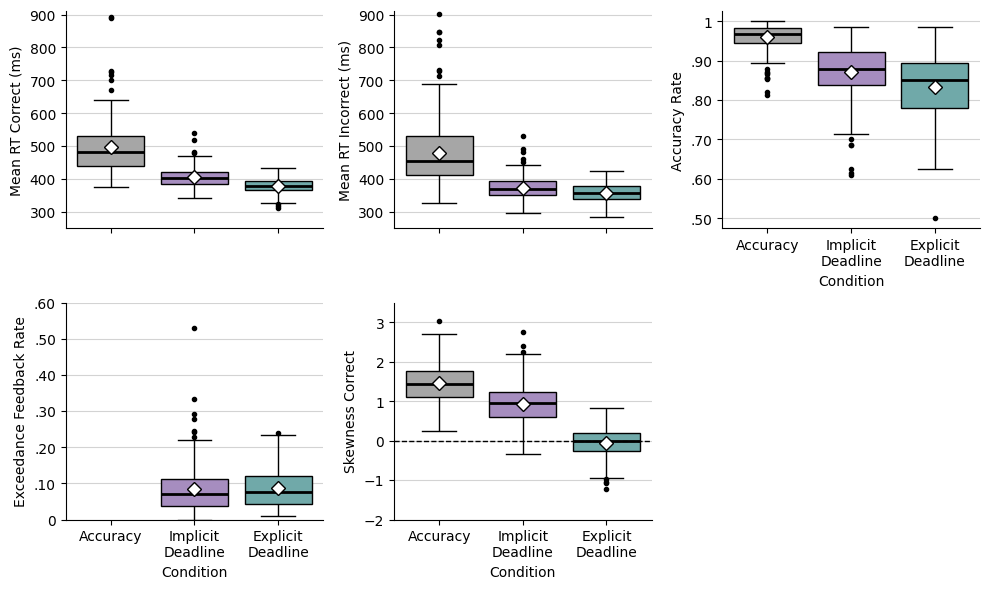

In [52]:
fancy_labels = ["Mean RT Correct (ms)", "Mean RT Incorrect (ms)", 
                "Accuracy Rate",
                "Exceedance Feedback Rate", "Skewness Correct"]

fig, axes = plt.subplots(2, 3, figsize=(10, 6))  
axes = axes.flatten()  

for i, param in enumerate(behavioral_params):
    ax = axes[i]  

    sns.boxplot(
        x='cond', hue="cond", y=param, data=result_empirical, order=condition_order, palette=palette, ax=ax,
        flierprops=dict(marker='o', markerfacecolor='black', markeredgecolor='black', markersize=3),
        boxprops=dict(edgecolor="black"),
        whiskerprops=dict(color="black"),
        capprops=dict(color="black"),
        medianprops=dict(color="black", linewidth=2)
    )
    
    ax.set_ylabel(fancy_labels[i])  

    ax.set_xticks(range(len(condition_labels)))
    
    if i < 2:
        ax.set_xticklabels([])
        ax.set_xlabel('')
    else:
        ax.set_xticklabels([label.replace(" ", "\n") for label in condition_labels])
        ax.set_xlabel('Condition')

    means = result_empirical.groupby('cond')[param].mean()
    for k, condition in enumerate(condition_order):
        mean_value = means[condition]
        ax.plot(k, mean_value, 'D', color='white', markersize=7, markeredgecolor='black', zorder=3)

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.grid(True, which='major', axis='y', color='lightgrey')

    if param in ["meanRT_correct", "meanRT_incorrect"]:
        ax.set_ylim([250, 910])

    if param in ["skew_correct", "skew_incorrect"]:
        ax.set_ylim([-2, 3.5])
        ax.axhline(0, color='black', linestyle='--', linewidth=1)

    if param == "timeout":
        ax.set_ylim([0, 0.6])

    if param in ["accuracy", "timeout"]:
        ax.yaxis.set_major_formatter(FuncFormatter(apa_tick_formatter(digits=2)))

for j in range(len(behavioral_params), len(axes)):
    fig.delaxes(axes[j])  

plt.tight_layout()
plt.savefig("figures/behav.png", transparent=True, dpi=MY_DPI)
plt.show()

acc


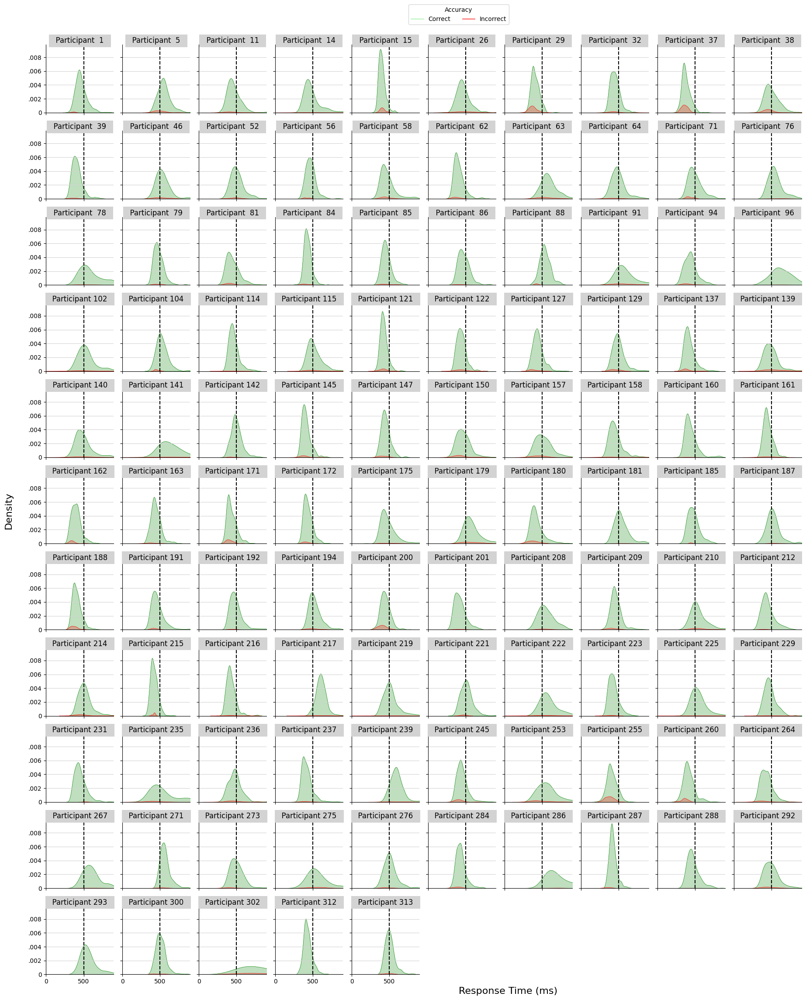

implicitDeadline


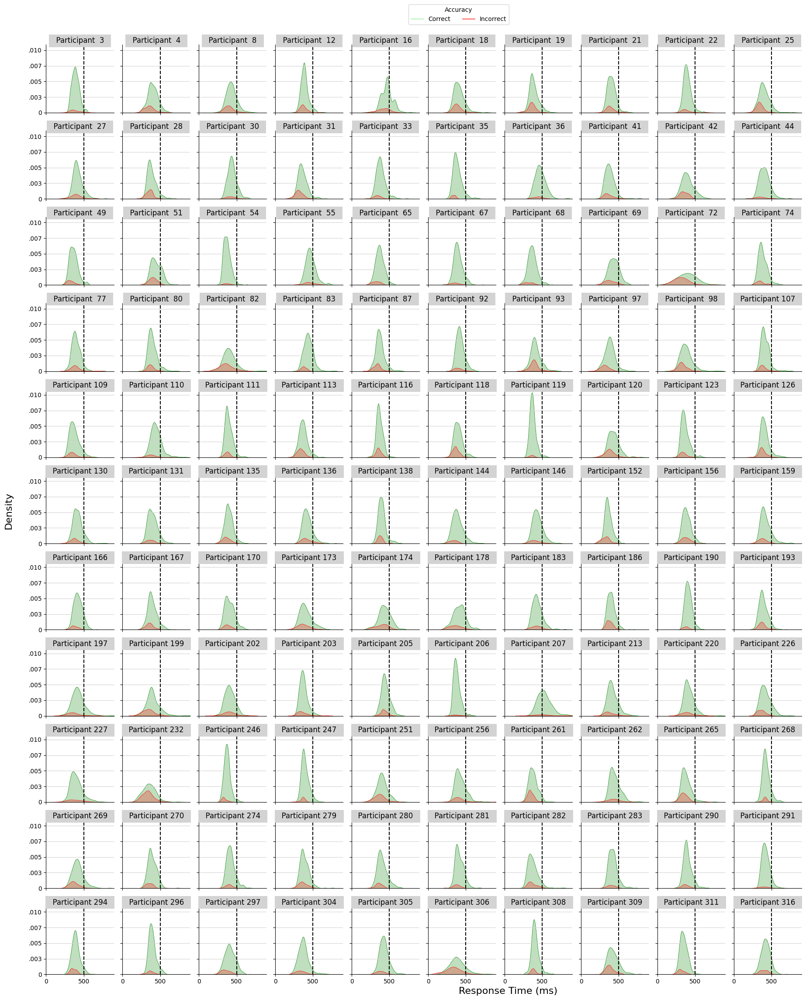

explicitDeadline


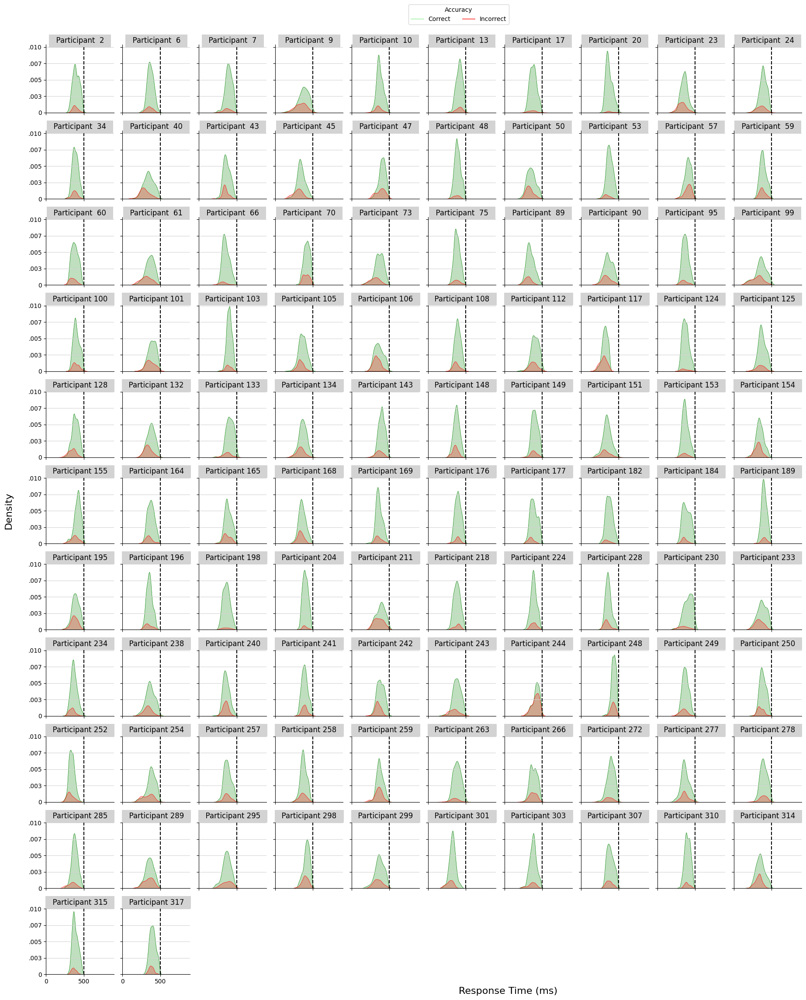

In [53]:
def plot_participant_rts(df, cols=10, my_font_size=16, LL_x=0, 
                         UL_x=900, network=None, cond=None):
    simulator_map = {"deadline": "deadline", "no_deadline": "no deadline"}
    condition_map = {"acc": "accuracy", "implicitDeadline": "implicit deadline", "explicitDeadline": "explicit deadline"}

    participants = sorted(df['pp'].unique())
    rows = (len(participants) + cols - 1) // cols  
    fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(2*cols, 2*rows), sharex=True, sharey=True)
    axes = axes.flatten()
    
    # Plot each participant in a separate subplot
    for idx, participant in enumerate(participants):
        ax = axes[idx]
        pp_df = df[df['pp'] == participant]
        part_df = pp_df[pp_df['origin'] != 'deadline']
        
        data_emp = part_df[(part_df['origin'] == 'empirical')]
        sns.kdeplot(data=data_emp, x='RT', hue="correct", linestyle='-', 
                    palette={0.0: 'red', 1.0: 'green'}, ax=ax, lw=0.5, label='Empirical',
                    fill=True, legend=False)
        ax.axvline(x=500, color='black', linestyle='--') 
    
        # Title 
        if participant < 100:
            leerzeichen = ' '
        else:
            leerzeichen = ''
        title_text = f'  Participant {leerzeichen}{participant}  '
        ax.set_title(title_text, fontsize=my_font_size-4, pad=0, loc='center',
                      bbox=dict(facecolor='lightgrey', edgecolor='none'))
        
        ax.set_xlim([LL_x, UL_x])
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.yaxis.set_major_formatter(FuncFormatter(apa_tick_formatter(digits=3)))
        ax.grid(True, which='major', axis='y', color='lightgrey', zorder=0) 

    # Add global x-axis label
    fig.text(0.5, 0.0, 'Response Time (ms)', va='center', rotation='horizontal', fontsize=my_font_size)
    fig.text(-0.02, 0.5, 'Density', va='center', rotation='vertical', fontsize=my_font_size)

    legend_elements = [
        mlines.Line2D([0], [0], color='lightgreen', lw=2, label='Correct', alpha=0.5),
        mlines.Line2D([0], [0], color='red', lw=2, label='Incorrect', alpha=0.5),
    ]
    
    fig.legend(handles=legend_elements, loc='upper center', title="Accuracy", bbox_to_anchor=(0.5, 1.03), ncol=2)

    for ax in axes[len(participants):]:
        ax.axis('off')

    plt.tight_layout(rect=[0, 0, 0.9, 1])  
    plt.savefig(f"figures/pp_rt_distributions_emp_{cond}.png", dpi=MY_DPI, bbox_inches="tight")
    plt.show()

for cond in ['acc', 'implicitDeadline', 'explicitDeadline']:
    print(cond)
    empirical_data_raw = prepare_data(data_type="empirical", calculate_by_symbol=False, return_type="raw")
    empirical_data_raw_cond = empirical_data_raw[empirical_data_raw['cond'] == cond]
    plot_participant_rts(empirical_data_raw_cond, my_font_size=16, network=network, cond=cond)

In [54]:
for cond in ['acc', 'implicitDeadline', 'explicitDeadline']:
    empirical_data_raw = prepare_data(data_type="empirical", calculate_by_symbol=False, return_type="raw")
    empirical_data_raw_cond = empirical_data_raw[empirical_data_raw['cond'] == cond]
    perc = (empirical_data_raw_cond['RT'] > 900).sum() / len(empirical_data_raw_cond['RT'])*100
    print(cond, perc.round(2))

acc 1.75
implicitDeadline 0.03
explicitDeadline 0.0


## Scatter Plots

In [55]:
my_font_size = 12
my_marker_size = 15
p_marker_alpha = 0.5
p_map = {"levy": "#073eb0", "ddm": "#f59827"}
p_alpha = 0.7

condition_map = {
    "acc": "Accuracy Condition",
    "implicitDeadline": "Implicit Deadline Condition",
    "explicitDeadline": "Explicit Deadline Condition"
}

In [56]:
def add_modelwise_r_squared(ax, data, empirical_col, simulation_col, fontsize, fontcolor=None, subscript1="LFM", subscript2="DM", y_pos=0.95):
    y_pos = y_pos
    line_spacing = 0.1  

    for model in ['levy', 'ddm']:
        subscript = subscript1 if model == 'levy' else subscript2
        r_squared_label = rf'R^2_{{\mathrm{{{subscript}}}}}'

        subset = data[data['model_simulation'] == model]
        emp = subset[empirical_col]
        sim = subset[simulation_col]
        mask = emp.notna() & sim.notna()

        if mask.any():
            r = emp[mask].corr(sim[mask])
            if pd.notna(r):
                r_squared = r ** 2

                if round(r_squared, 2) == 0:
                    r_squared_str = '0'
                elif abs(round(r_squared, 2)) == 1:
                    r_squared_str = '1'
                elif 0 < abs(r_squared) < 1:
                    r_squared_str = f'{r_squared:.2f}'.replace('0.', '.')
                else:
                    r_squared_str = f'{r_squared:.2f}'

                text = rf'${r_squared_label} = {r_squared_str}$'

                ax.text(0.05, y_pos, text,
                        transform=ax.transAxes,
                        fontsize=fontsize,
                        verticalalignment='top',
                        horizontalalignment='left',
                        color=fontcolor if fontcolor else p_map[model])
                
                y_pos -= line_spacing

Network 1


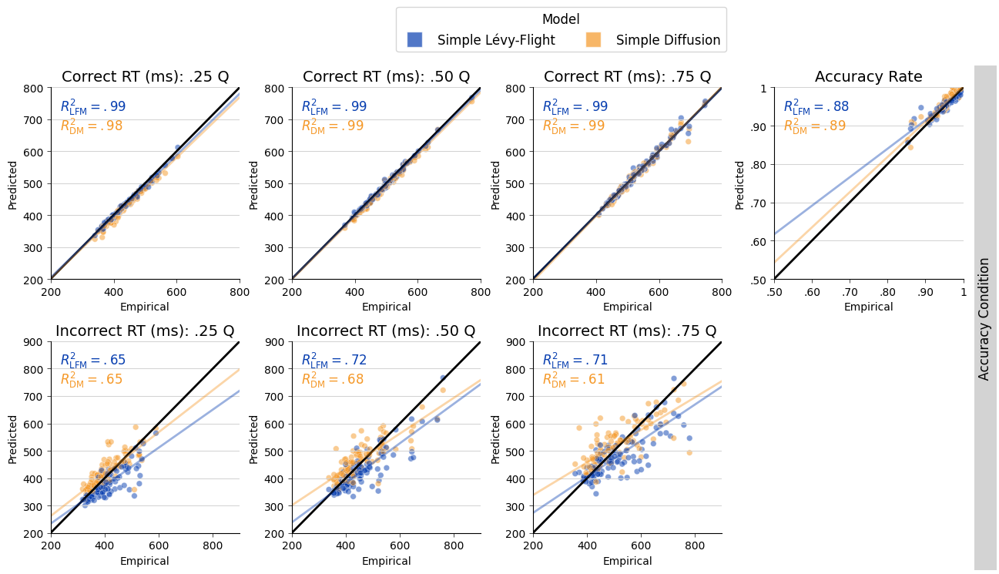

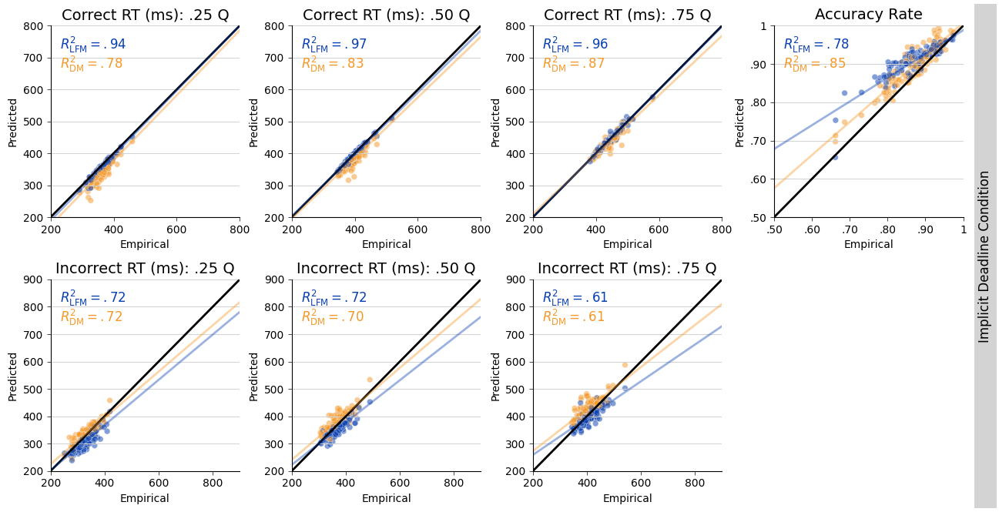

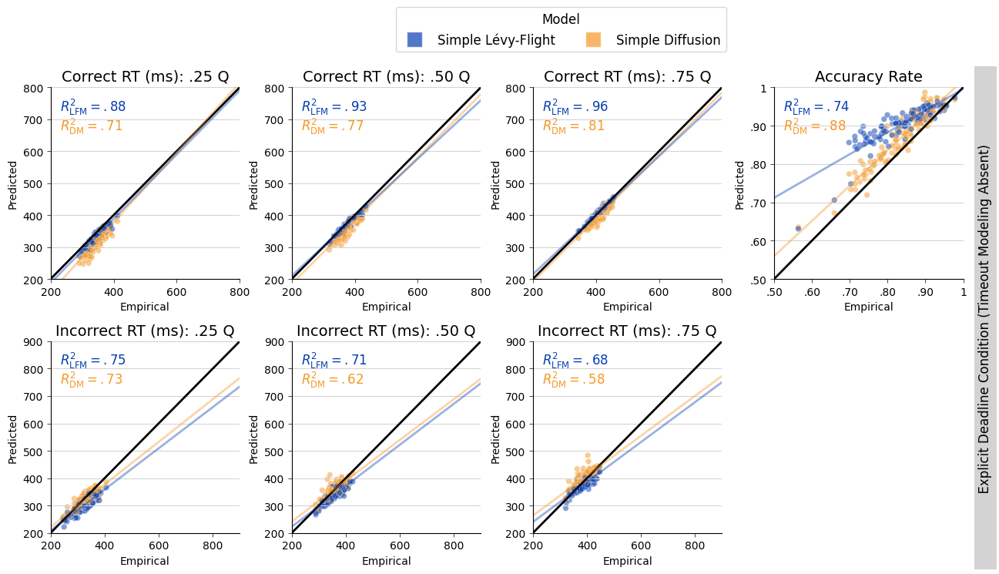

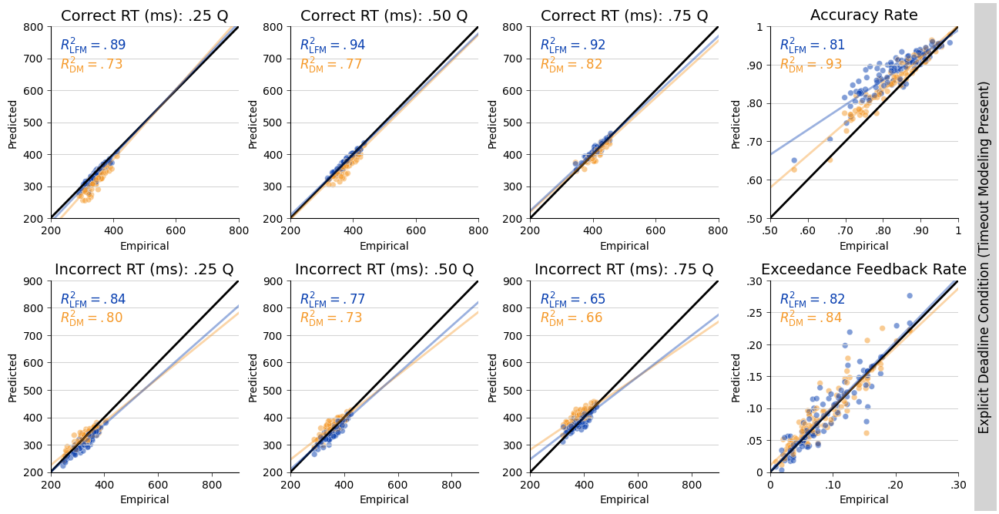

Network 2


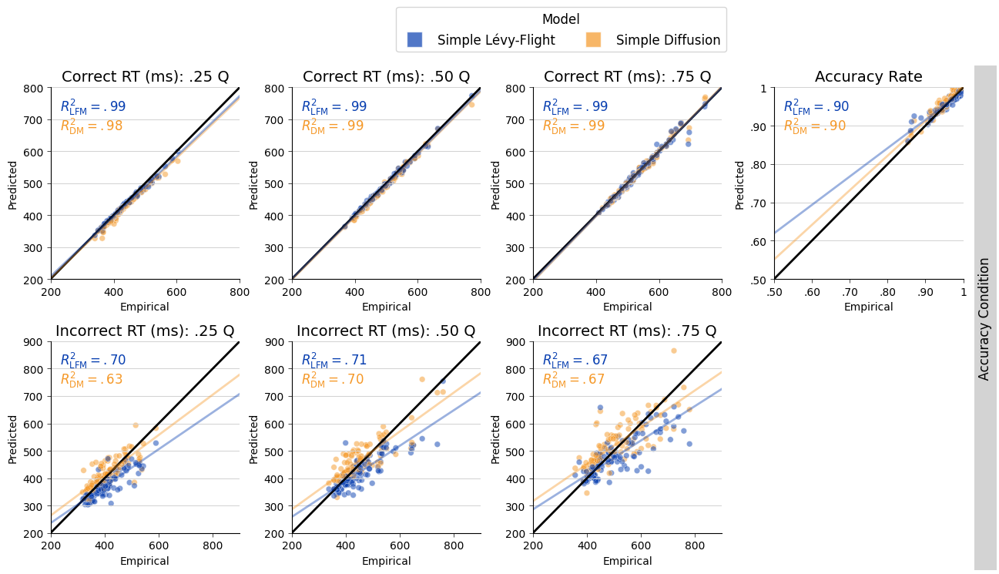

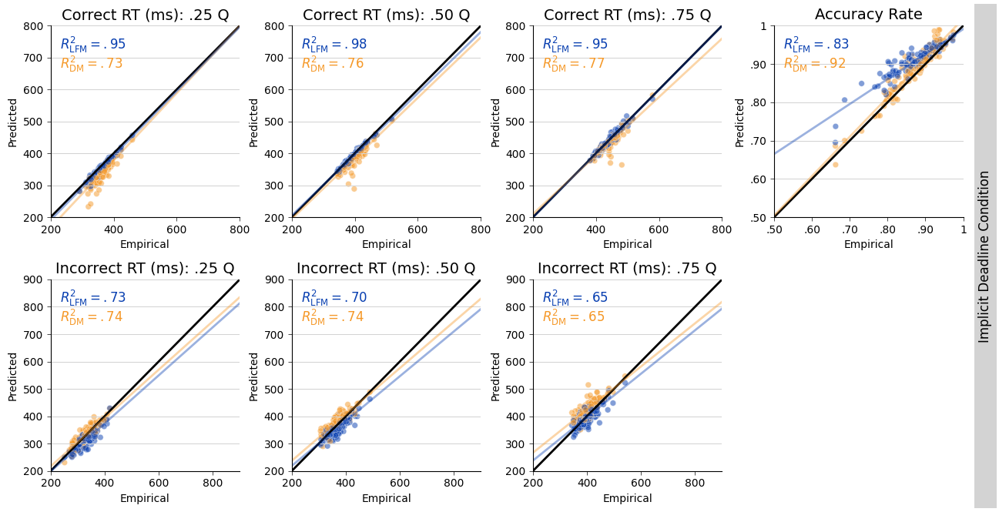

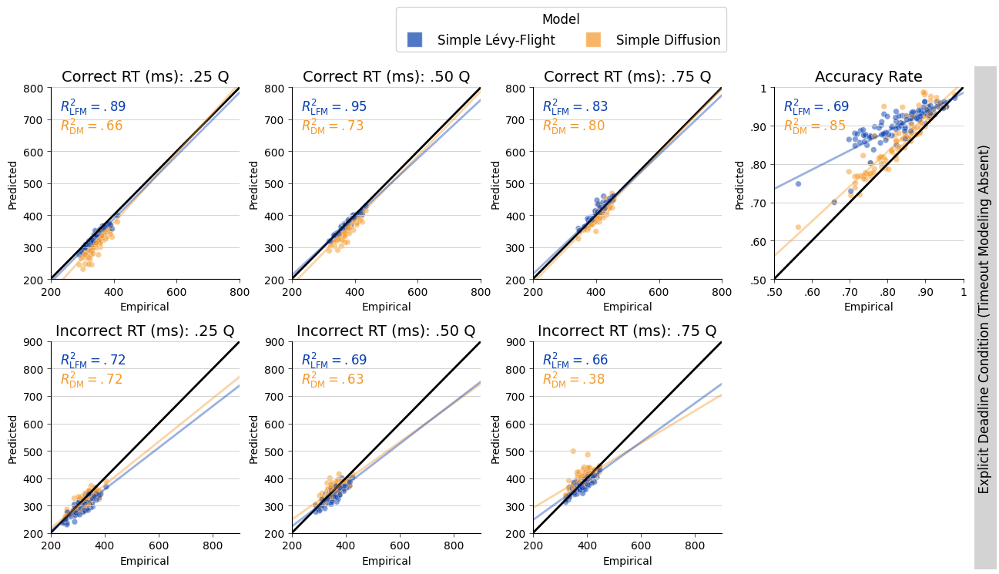

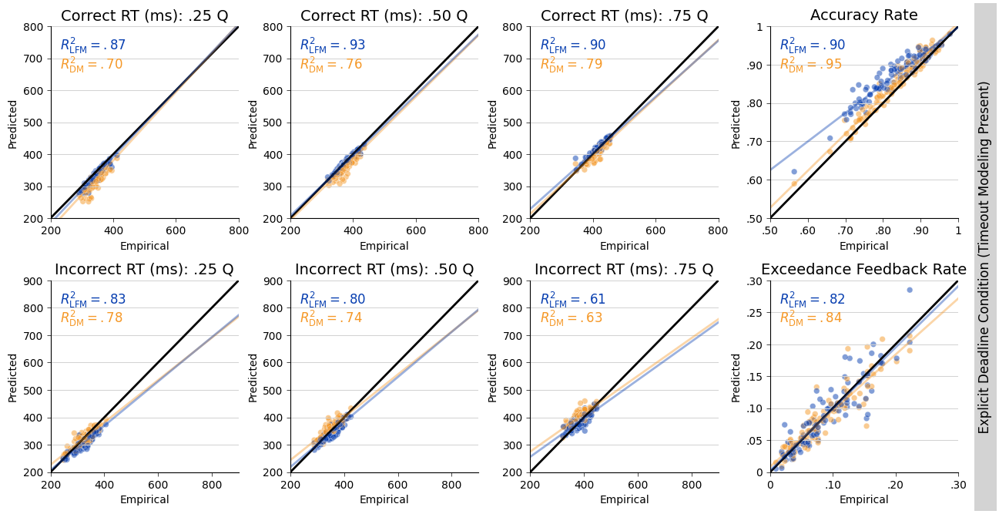

In [57]:
def plot_panel(ax, data, x, y, title, lims, hue, palette, alpha, 
               marker="o", marker_size=30, my_linestyle='-', xlabel="Empirical", ylabel="Predicted"):
    sns.scatterplot(
        data=data,
        x=x, y=y,
        hue=hue,
        style=None,          
        marker=marker,       
        palette=palette,
        ax=ax,
        alpha=alpha,
        legend=False,
        s=marker_size
    )
    
    ax.plot(lims, lims, 'k-', lw=2)

    # Extended regression line per model
    for model in data[hue].unique():
        sub_data = data[data[hue] == model][[x, y]].dropna()
        if sub_data.empty:
            continue

        X = sub_data[[x]].values.reshape(-1, 1)
        y_vals = sub_data[y].values
        reg = LinearRegression().fit(X, y_vals)

        x_line = np.linspace(lims[0], lims[1], 100).reshape(-1, 1)
        y_line = reg.predict(x_line)

        ax.plot(x_line, y_line, color=palette[model], linewidth=2, alpha=0.4)
        
    ax.set_xlim(lims)
    ax.set_ylim(lims)
    ax.set_xlabel(xlabel)#, fontsize=fontsize - 2)
    ax.set_ylabel(ylabel)#, fontsize=fontsize - 2)
    ax.set_title(title, fontsize=my_font_size+2)
    if (x != "skew_correct_empirical"):
        ax.yaxis.set_major_formatter(FuncFormatter(apa_tick_formatter(digits=2)))
    if (x == "accuracy_empirical") or (x == "timeout_empirical"):
        ax.xaxis.set_major_formatter(FuncFormatter(apa_tick_formatter(digits=2)))
    ax.grid(True, axis='y', color='lightgrey', linestyle='-', linewidth=0.75, zorder=0)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    ax.tick_params(
        axis='both', which='both', bottom=True, top=False, left=True, right=False, #length=5,  
        width=0.5, direction='out')

for network in range(NUM_ENSEMBLE_MEMBERS):
    print("Network", network + 1)
    for s in SIMULATOR_CONTEXTS:
        if s == "no_deadline":
            marker="o"
            my_linestyle='-'
        else:
            marker="D"
            my_linestyle='-'
            
        result_simulated = pd.concat([
            prepare_data("simulated", 0, "summary", network=network, p="ddm", s=s),
            prepare_data("simulated", 0, "summary", network=network, p="levy", s=s)
        ])
        
        quantile_labels = ['0.25', '0.5', '0.75']
        quantile_headings = ['.25', '.50', '.75']
        my_conds = condition_order if s == "no_deadline" else result_simulated['cond'].unique()
        
        for cond in my_conds:
            emp = result_empirical_osy[result_empirical_osy['cond'] == cond]
            sim = result_simulated[result_simulated['cond'] == cond]
            merged = pd.merge(emp, sim, on=['pp', 'cond'], suffixes=('_empirical', '_simulation'))

            fig, axs = plt.subplots(2, 4, figsize=(12.75, 7.5))

            # --- Correct RTs ---
            for i, q in enumerate(quantile_labels):
                emp_col = f'{q}_correct_empirical'
                sim_col = f'{q}_correct_simulation'
                if emp_col not in merged or sim_col not in merged:
                    continue
                label = f'Correct RT (ms): {quantile_headings[i]} Q'
                plot_panel(axs[0, i], merged,
                           x=emp_col,
                           y=sim_col,
                           title=label,
                           lims=[200, 800],
                           hue='model_simulation',
                           palette=p_map,
                           alpha=p_marker_alpha)#, fontsize=my_font_size)
                add_modelwise_r_squared(axs[0, i], merged, emp_col, sim_col, fontsize=my_font_size)

            # --- Incorrect RTs ---
            for i, q in enumerate(quantile_labels):
                emp_col = f'{q}_incorrect_empirical'
                sim_col = f'{q}_incorrect_simulation'
                if emp_col not in merged or sim_col not in merged:
                    continue
                label = f'Incorrect RT (ms): {quantile_headings[i]} Q'
                plot_panel(axs[1, i], merged,
                           x=emp_col,
                           y=sim_col,
                           title=label,
                           lims=[200, 900],
                           hue='model_simulation',
                           palette=p_map,
                           alpha=p_marker_alpha)#,fontsize=my_font_size)
                add_modelwise_r_squared(axs[1, i], merged, emp_col, sim_col, fontsize=my_font_size)

            # --- Accuracy ---
            plot_panel(axs[0, 3], merged,
                       x='accuracy_empirical',
                       y='accuracy_simulation',
                       title='Accuracy Rate',
                       lims=[0.5, 1],
                       hue='model_simulation',
                       palette=p_map,
                       alpha=p_marker_alpha)#, fontsize=my_font_size
            add_modelwise_r_squared(axs[0, 3], merged, 'accuracy_empirical', 'accuracy_simulation', 
                                      fontsize=my_font_size)

            if s!="deadline":            
                axs[1, 3].axis('off')
            else:
                plot_panel(axs[1, 3], merged,
                       x='timeout_empirical',
                       y='timeout_simulation',
                       title='Exceedance Feedback Rate',
                       lims=[0, 0.3],
                       hue='model_simulation',
                       palette=p_map,
                       alpha=p_marker_alpha)#, fontsize=my_font_size
                add_modelwise_r_squared(axs[1, 3], merged, 'timeout_empirical', 'timeout_simulation', 
                                      fontsize=my_font_size)

            spacer_map = {
                "acc": " " * 46,
                "implicitDeadline": " " * 40,
                "explicitDeadline": " " * 18
            }
            spacer = spacer_map.get(cond, "")
            add_timeout = ""
            if cond == "explicitDeadline":
                if s == "no_deadline":
                    add_timeout = " (Timeout Modeling Absent)"
                elif s == "deadline":
                    add_timeout = " (Timeout Modeling Present)"

            fig.text(1.0, 0.45, f"{spacer}{condition_map.get(cond)}{add_timeout}{spacer}",
                     va='center', ha='left', rotation='vertical', bbox=dict(facecolor='lightgrey', edgecolor='none'),
                     fontsize=my_font_size)

            if cond == "acc" or (cond == "explicitDeadline" and s == "no_deadline"):
                legend_items = [mlines.Line2D([0], [0], marker='s', color='w', label="Simple Lévy-Flight",
                                              markerfacecolor=p_map["levy"], markersize=my_marker_size, alpha=p_alpha),
                                mlines.Line2D([0], [0], marker='s', color='w', label="Simple Diffusion",
                                              markerfacecolor=p_map["ddm"], markersize=my_marker_size, alpha=p_alpha)]
                legend2 = fig.legend(handles=legend_items, bbox_to_anchor=(.75, 0.999), ncol=2, 
                                         title='Model', fontsize=my_font_size)
                legend2._legend_box.align = "center"
                plt.setp(legend2.get_title(), fontsize=my_font_size)

            plt.tight_layout(rect=[0, 0.0, 1, 0.9])
            plt.subplots_adjust(wspace=0.275, hspace=0.325)

            plt.savefig(f"figures/scatterplot2_quartiles_R2_net{network+1}_{cond}_{s}.png", 
                        transparent=False, bbox_inches="tight", dpi=MY_DPI)
            plt.show()

## Fun Plots

Network 1


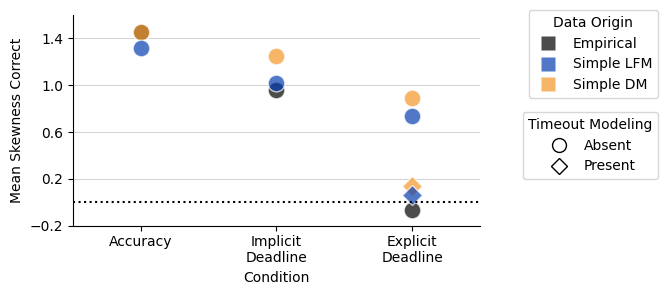

Network 2


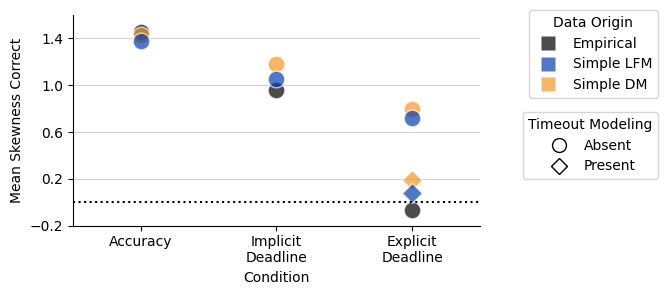

In [58]:
def fun_plots():
    my_marker_size = 12
    my_marker_size_new = my_marker_size - 2
    new_marker = "D"
    x_pad = 0.5
    new_color = "teal"
    levy_color = "#073eb0"
    ddm_color = "#f59827"
    emp_color = "black"

    for network in range(NUM_ENSEMBLE_MEMBERS):
        print("Network", network + 1)

        result_empirical = prepare_data(data_type="empirical", calculate_by_symbol=False, return_type="summary")
        stats_ddm_no_deadline = prepare_data(data_type="simulated", calculate_by_symbol=False, return_type="summary", network=network, p="ddm", s="no_deadline")
        stats_ddm_deadline = prepare_data(data_type="simulated", calculate_by_symbol=False, return_type="summary", network=network, p="ddm", s="deadline")
        stats_lfm_no_deadline = prepare_data(data_type="simulated", calculate_by_symbol=False, return_type="summary", network=network, p="levy", s="no_deadline")
        stats_lfm_deadline = prepare_data(data_type="simulated", calculate_by_symbol=False, return_type="summary", network=network, p="levy", s="deadline")

        stats_ddm_deadline["cond"] = "Explicit deadline (re)"
        stats_lfm_deadline["cond"] = "Explicit deadline (re)"
        stats_ddm = pd.concat([stats_ddm_no_deadline, stats_ddm_deadline])
        stats_lfm = pd.concat([stats_lfm_no_deadline, stats_lfm_deadline])
        simulated_stats = pd.concat([stats_ddm, stats_lfm])
        combined_results = pd.concat([simulated_stats, result_empirical])

        means_by_cond_origin = combined_results.groupby(['cond', 'model', 'origin']).mean().reset_index()
        means_by_cond_origin = means_by_cond_origin.drop(columns=['pp', 'timeout'])
        means_by_cond_origin = means_by_cond_origin.drop_duplicates()
        means_by_cond_origin['cond'] = pd.Categorical(means_by_cond_origin['cond'], categories=mixed_condition_order, ordered=True)

        fig, ax1 = plt.subplots(figsize=(5, 3))

        for cond in condition_order:
            data_empirical = means_by_cond_origin[(means_by_cond_origin['cond'] == cond) & (means_by_cond_origin['model'] == 'none')]
            data_ddm = means_by_cond_origin[(means_by_cond_origin['cond'] == cond) & (means_by_cond_origin['model'] == 'ddm')]
            data_levy = means_by_cond_origin[(means_by_cond_origin['cond'] == cond) & (means_by_cond_origin['model'] == 'levy')]

            x_pos = condition_order.index(cond)

            ax1.plot(x_pos, data_empirical['skew_correct'], 'o', markeredgecolor="white", markerfacecolor=emp_color, markersize=my_marker_size, alpha=p_alpha)
            ax1.plot(x_pos, data_ddm['skew_correct'], 'o', markeredgecolor="white", markerfacecolor=ddm_color, markersize=my_marker_size, alpha=p_alpha)
            ax1.plot(x_pos, data_levy['skew_correct'], 'o', markeredgecolor="white", markerfacecolor=levy_color, markersize=my_marker_size, alpha=p_alpha)

            if cond == "explicitDeadline":
                data_ddm_re = means_by_cond_origin[(means_by_cond_origin['cond'] == 'Explicit deadline (re)') & (means_by_cond_origin['model'] == 'ddm')]
                data_levy_re = means_by_cond_origin[(means_by_cond_origin['cond'] == 'Explicit deadline (re)') & (means_by_cond_origin['model'] == 'levy')]

                ax1.plot(x_pos, data_ddm_re['skew_correct'], new_marker, markeredgecolor="white", markerfacecolor=ddm_color, markersize=my_marker_size_new, alpha=p_alpha)
                ax1.plot(x_pos, data_levy_re['skew_correct'], new_marker, markeredgecolor="white", markerfacecolor=levy_color, markersize=my_marker_size_new, alpha=p_alpha)

        ax1.axhline(y=0, color='black', linestyle=':')
        ax1.set_ylabel('Mean Skewness Correct')
        ax1.set_ylim(-0.2, 1.6)
        ax1.set_xlim(-x_pad, len(condition_order) - 1 + x_pad)
        ax1.set_xticks(range(len(condition_order)))
        ax1.set_xticklabels([label.replace(" ", "\n") for label in condition_labels])
        ax1.set_xlabel('Condition')
        ax1.set_yticks(np.arange(-0.2, 1.6, 0.4))
        ax1.spines['top'].set_visible(False)
        ax1.spines['right'].set_visible(False)
        ax1.grid(True, which='major', axis='y', color='lightgrey', linestyle='-', linewidth=0.75, zorder=0)

        legend_elements = [
            mlines.Line2D([0], [0], marker='s', color='None', label='Empirical', markeredgecolor="None", markerfacecolor=emp_color, markersize=my_marker_size-2, alpha=p_alpha),
            mlines.Line2D([0], [0], marker='s', color='None', label='Simple LFM', markeredgecolor="None", markerfacecolor=levy_color, markersize=my_marker_size-2, alpha=p_alpha),
            mlines.Line2D([0], [0], marker='s', color='None', label='Simple DM', markeredgecolor="None", markerfacecolor=ddm_color, markersize=my_marker_size-2, alpha=p_alpha)
        ]
        legend_fill = [
            mlines.Line2D([0], [0], marker='o', color='w', label=simulator_labels[0], markeredgecolor=emp_color, markersize=my_marker_size-2),
            mlines.Line2D([0], [0], marker=new_marker, color='w', label=simulator_labels[1], markeredgecolor=emp_color, markersize=my_marker_size_new-2),
        ]

        _ = fig.legend(handles=legend_elements, loc='upper right', bbox_to_anchor=(1.34, 0.99), ncol=1, title='Data Origin')
        _ = fig.legend(handles=legend_fill, loc='upper right', bbox_to_anchor=(1.34, 0.65), ncol=1, title=simulator_title)

        filename = f"figures/fun_plots_net{network + 1}.png"
        plt.tight_layout()
        plt.savefig(filename, transparent=True, bbox_inches="tight", dpi=MY_DPI)
        plt.show()  
fun_plots()

## Cross-Participant RT Distributions

In [59]:
network = 0
all_empirical_data2 = prepare_data(data_type="empirical", calculate_by_symbol=False, return_type="raw", )
levy_data_no_deadline = prepare_data(data_type="simulated", calculate_by_symbol=False, return_type="raw", 
                 network=network, p="levy", s="no_deadline")
levy_data_deadline = prepare_data(data_type="simulated", calculate_by_symbol=False, return_type="raw", 
                 network=network, p="levy", s="deadline")
ddm_data_no_deadline = prepare_data(data_type="simulated", calculate_by_symbol=False, return_type="raw", 
                 network=network, p="ddm", s="no_deadline")
ddm_data_deadline = prepare_data(data_type="simulated", calculate_by_symbol=False, return_type="raw", 
                 network=network, p="ddm", s="deadline")

combined_data = pd.concat([all_empirical_data2, 
                           levy_data_no_deadline, ddm_data_no_deadline,
                           levy_data_deadline, ddm_data_deadline
                          ]) 

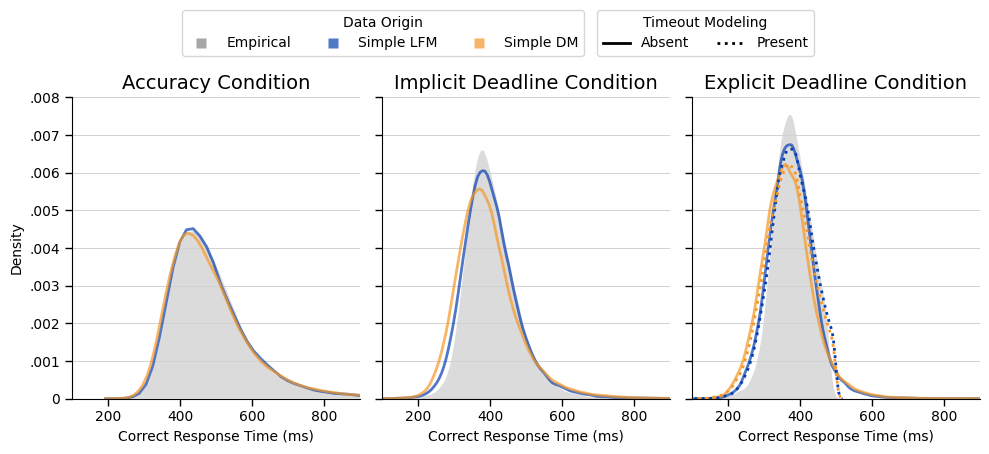

In [60]:
def plot_grouped_conditions_rts(df, conditions=['acc', 'implicitDeadline', 'explicitDeadline'],
                                t_linestyle=":",
                                my_font_size=14, LL_x=100, UL_x=900, UL_y=.008,
                                p_alpha=0.7, plot_hue=True, plot_deadline=False):

    levy_color = "#073eb0"
    ddm_color = "#f59827"
    emp_color = "black"
    my_marker_size = 9
    
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 4), sharey=True)

    for s in ['no_deadline', 'deadline']:
        if s == 'no_deadline':
            for idx, cond in enumerate(conditions):
                ax = axes[idx]
                
                cond_df = df[(df['cond'] == cond) & (df['origin'] != 'deadline')]
                if not plot_hue:
                    cond_df = cond_df[cond_df["correct"] == 1]

                # Empirical data
                empirical_data = cond_df[cond_df['origin'] == 'empirical']
                sns.kdeplot(data=empirical_data, x='RT',
                            hue="correct" if plot_hue else None,
                            palette={0.0: emp_color, 1.0: emp_color} if plot_hue else None,
                            color=None if plot_hue else emp_color,
                            ax=ax, lw=0, label='Empirical',
                            legend=False, alpha=.14, fill=1)
                
                # Simulated data by Levy
                levy_data = cond_df[(cond_df['origin'] != 'empirical') & (cond_df['model'] == 'levy')]
                sns.kdeplot(data=levy_data, x='RT',
                            hue="correct" if plot_hue else None,
                            palette={0.0: levy_color, 1.0: levy_color} if plot_hue else None,
                            color=None if plot_hue else levy_color,
                            linestyle='-', fill=0, alpha=p_alpha,
                            ax=ax, lw=2, label='Levy', legend=False)
                
                # Simulated data by DDM
                ddm_data = cond_df[(cond_df['origin'] != 'empirical') & (cond_df['model'] == 'ddm')]
                sns.kdeplot(data=ddm_data, x='RT',
                            hue="correct" if plot_hue else None,
                            palette={0.0: ddm_color, 1.0: ddm_color} if plot_hue else None,
                            color=None if plot_hue else ddm_color,
                            linestyle='-', fill=0, alpha=p_alpha,
                            ax=ax, lw=2, label='DDM', legend=False)
                
                ax.set_title(f'{condition_map.get(cond)}', fontsize=14)

                if idx == 2:
                    cond_df = df[(df['cond'] == cond) & (df['origin'] != 'no_deadline')]
                    if not plot_hue:
                        cond_df = cond_df[cond_df["correct"] == 1]
                    
                    # Simulated data by Levy
                    levy_data = cond_df[(cond_df['origin'] != 'empirical') & (cond_df['model'] == 'levy')]
                    sns.kdeplot(data=levy_data, x='RT',
                                hue="correct" if plot_hue else None,
                                palette={0.0: levy_color, 1.0: levy_color} if plot_hue else None,
                                color=None if plot_hue else levy_color,
                                linestyle=t_linestyle, ax=ax, lw=2,
                                label='Levy Simulated', legend=False)
                    
                    # Simulated data by DDM
                    ddm_data = cond_df[(cond_df['origin'] != 'empirical') & (cond_df['model'] == 'ddm')]
                    sns.kdeplot(data=ddm_data, x='RT',
                                hue="correct" if plot_hue else None,
                                palette={0.0: ddm_color, 1.0: ddm_color} if plot_hue else None,
                                color=None if plot_hue else ddm_color,
                                linestyle=t_linestyle, ax=ax, lw=2,
                                label='DDM Simulated', legend=False)
                    if plot_deadline:
                        ax.axvline(x=500, color='black', linestyle='--', linewidth=1) 

    for ax in axes:
        ax.grid(True, axis='y', color='lightgrey', linestyle='-', linewidth=0.75, zorder=0)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.set_xlim([LL_x, UL_x])
        ax.set_ylim([0, UL_y])
        ax.set_xlabel('Correct Response Time (ms)' if not plot_hue else 'Reaction Time (ms)')
        ax.tick_params(axis='both', which='both', bottom=True, top=False, left=True, right=False, length=5, width=1, direction='out')
        ax.yaxis.set_major_formatter(FuncFormatter(apa_tick_formatter(digits=3)))
        ax.set_xticks([200, 400, 600, 800])

    legend_elements_color = [
        mlines.Line2D([0], [0], marker='s', color='None', label='Empirical',
                      markeredgecolor="None", markerfacecolor=emp_color, markersize=my_marker_size-2, alpha=.35),
        mlines.Line2D([0], [0], marker='s', color='None', label='Simple LFM',
                      markeredgecolor="None", markerfacecolor=levy_color, markersize=my_marker_size-2, alpha=p_alpha),
        mlines.Line2D([0], [0], marker='s', color='None', label='Simple DM',
                      markeredgecolor="None", markerfacecolor=ddm_color, markersize=my_marker_size-2, alpha=p_alpha)
    ]
    
    legend_elements_line = [
        mlines.Line2D([0], [0], color='black', lw=2, label=simulator_labels[0], linestyle='-'),
        mlines.Line2D([0], [0], color='black', lw=2, label=simulator_labels[1], linestyle=':')
    ]
    
    fig = plt.gcf()
    fig.legend(handles=legend_elements_color, title="Data Origin", loc='upper left', bbox_to_anchor=(0.18, 1.14), ncol=3)
    fig.legend(handles=legend_elements_line, title=simulator_title, loc='upper left', bbox_to_anchor=(0.595, 1.14), ncol=2)

    plt.tight_layout()
    suffix = "corr" if not plot_hue else "all"
    plt.savefig(f"figures/dist_{suffix}_rts_combined_net{network+1}.png", bbox_inches='tight', transparent=True, dpi=MY_DPI)
    plt.show()
plot_grouped_conditions_rts(combined_data, plot_hue=False)